<a href="https://colab.research.google.com/github/toraaglobal/tutorial/blob/data_analytics/time_series_forcasting_using_prophet.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Time Series Using Prophet
***

Another alternative for building time series models at scale.  Based on the research from facebook - [Prophet](https://research.fb.com/prophet-forecasting-at-scale/) - allows the user to quickly produce high quality forecasts with the ability to adjust multiple parameters.
Initial code modeled after Digital Ocean's [tutorial](https://www.digitalocean.com/community/tutorials/a-guide-to-time-series-forecasting-with-prophet-in-python-3).



In [1]:
%matplotlib inline
import pandas as pd
from fbprophet import Prophet

import matplotlib.pyplot as plt
plt.style.use('fivethirtyeight')

### Load Data

In [3]:
df = pd.read_csv('https://raw.githubusercontent.com/toraaglobal/tutorial/data_analytics/OnCampusWeeklyData.csv')
df.head()

,Store,Dept,Date,Weekly_Sales,IsHoliday
0,1,1,2/5/2010,24924.50,False
1,1,1,2/12/2010,46039.49,True
2,1,1,2/19/2010,41595.55,False
3,1,1,2/26/2010,19403.54,False
4,1,1,3/5/2010,21827.90,False


### convert the data column to datatime using pandas to_datatime

In [4]:
df['Date'] = pd.to_datetime(df['Date'])

df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 421570 entries, 0 to 421569
Data columns (total 5 columns):
 #   Column        Non-Null Count   Dtype         
---  ------        --------------   -----         
 0   Store         421570 non-null  int64         
 1   Dept          421570 non-null  int64         
 2   Date          421570 non-null  datetime64[ns]
 3   Weekly_Sales  421570 non-null  float64       
 4   IsHoliday     421570 non-null  bool          
dtypes: bool(1), datetime64[ns](1), float64(1), int64(2)
memory usage: 13.3 MB


In [5]:
df.shape

(421570, 5)

In [6]:
df.isnull().sum()

Store           0
Dept            0
Date            0
Weekly_Sales    0
IsHoliday       0
dtype: int64

### Data Prep

In [7]:
# Rename zip code column for clarity
df = df.rename(index=str, columns={"Date": "ds", 'Weekly_Sales':'y'})
df.head()

,Store,Dept,ds,y,IsHoliday
0,1,1,2010-02-05,24924.50,False
1,1,1,2010-02-12,46039.49,True
2,1,1,2010-02-19,41595.55,False
3,1,1,2010-02-26,19403.54,False
4,1,1,2010-03-05,21827.90,False


In [8]:
df.Dept.unique()

array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 16, 17, 18,
       19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35,
       36, 37, 38, 40, 41, 42, 44, 45, 46, 47, 48, 49, 51, 52, 54, 55, 56,
       58, 59, 60, 67, 71, 72, 74, 77, 78, 79, 80, 81, 82, 83, 85, 87, 90,
       91, 92, 93, 94, 95, 96, 97, 98, 99, 39, 50, 43, 65])

In [9]:
## take a subset of Dept 9
df9 = df[df['Dept'] == 9]

df9.head()

,Store,Dept,ds,y,IsHoliday
1144,1,9,2010-02-05,16930.99,False
1145,1,9,2010-02-12,16562.49,True
1146,1,9,2010-02-19,15880.85,False
1147,1,9,2010-02-26,15175.52,False
1148,1,9,2010-03-05,24064.70,False


Prophet limits the naming convention of the input columns to be ds (date) and y (the value) - following code renames columns in the Data Frame - and makes data table [dfs] for each department with given format.

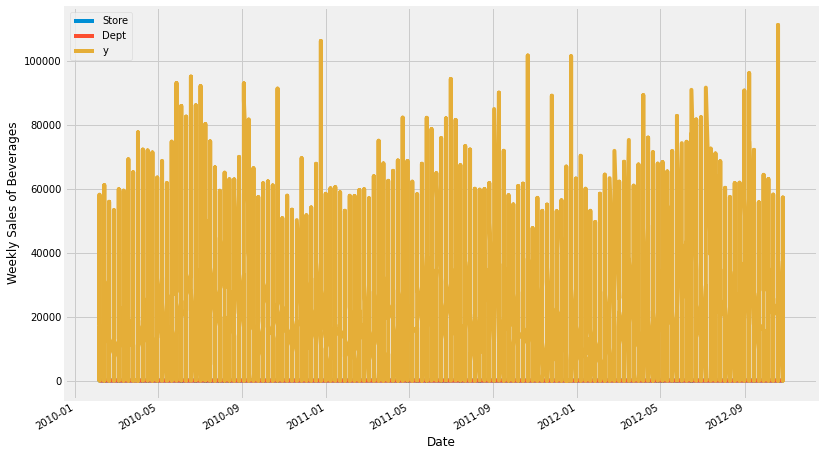

In [10]:
ax = df9.set_index('ds').plot(figsize=(12, 8))
ax.set_ylabel('Weekly Sales of Beverages')
ax.set_xlabel('Date')

plt.show()

### MODEL

In [11]:

# Set the uncertainty interval to 95% (the Prophet default is 80%)
bev_model = Prophet(interval_width=0.95)
bev_model.fit(df9)

INFO:numexpr.utils:NumExpr defaulting to 2 threads.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


In [12]:
future_dates = bev_model.make_future_dataframe(periods=13, freq='W')
future_dates.tail()

,ds
6362,2012-12-23
6363,2012-12-30
6364,2013-01-06
6365,2013-01-13
6366,2013-01-20


In [13]:
# MODEL
forecast = bev_model.predict(future_dates)
forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()

,ds,yhat,yhat_lower,yhat_upper
6362,2012-12-23,23904.278373,-9179.054539,54570.683528
6363,2012-12-30,21274.883970,-9669.318177,52572.499220
6364,2013-01-06,15750.798177,-16830.449798,45634.868730
6365,2013-01-13,11042.744629,-22587.061110,44700.413860
6366,2013-01-20,10045.273217,-21463.929257,37973.325636


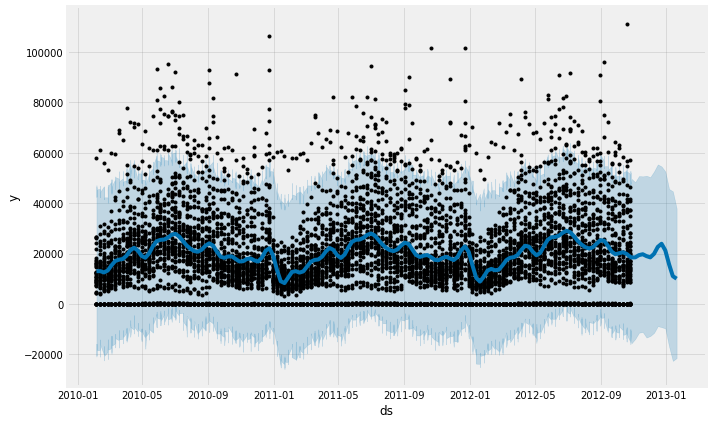

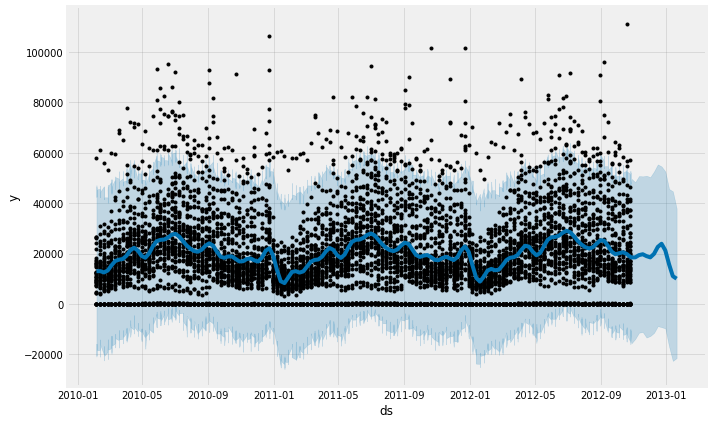

In [14]:
# MODEL
bev_model.plot(forecast, uncertainty=True)

### Model Interpretation

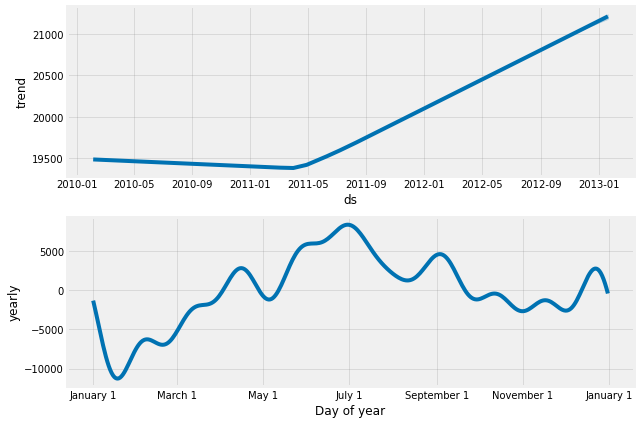

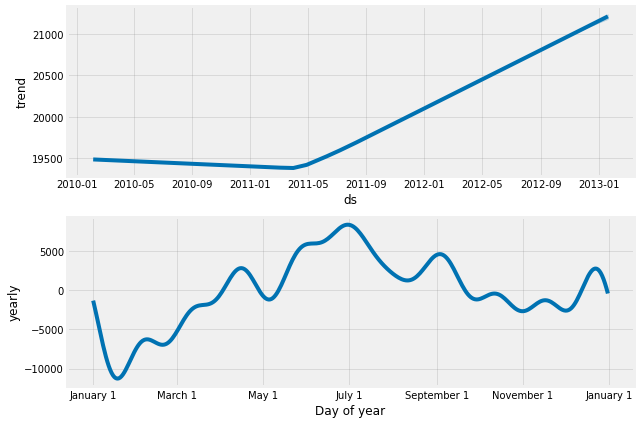

In [15]:
# INTERPRET
bev_model.plot_components(forecast)

In [16]:
## Model for all department
def run_prophet(df):
  model = Prophet(interval_width=0.95)
  model.fit(df)
  future_dates = model.make_future_dataframe(periods=13, freq='W')
  print(future_dates.tail())
  # MODEL
  forecast = model.predict(future_dates)
  print(forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail())
  print('Forcasting')
  model.plot(forecast, uncertainty=True)
  plt.show()
  print('Model Intepretation')
  model.plot_components(forecast)
  plt.show()
  

In [17]:
dept = list( df.Dept.unique())
print(dept)

[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 40, 41, 42, 44, 45, 46, 47, 48, 49, 51, 52, 54, 55, 56, 58, 59, 60, 67, 71, 72, 74, 77, 78, 79, 80, 81, 82, 83, 85, 87, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 39, 50, 43, 65]


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Department: 1
             ds
6443 2012-12-23
6444 2012-12-30
6445 2013-01-06
6446 2013-01-13
6447 2013-01-20
             ds          yhat    yhat_lower    yhat_upper
6443 2012-12-23  36715.941434  11337.139066  62064.305986
6444 2012-12-30  25449.262281   -332.272829  49651.284130
6445 2013-01-06  14184.488365 -13080.734403  40953.536479
6446 2013-01-13   8784.162362 -17679.927264  34331.893503
6447 2013-01-20  10187.900113 -15997.937106  36650.863871
Forcasting


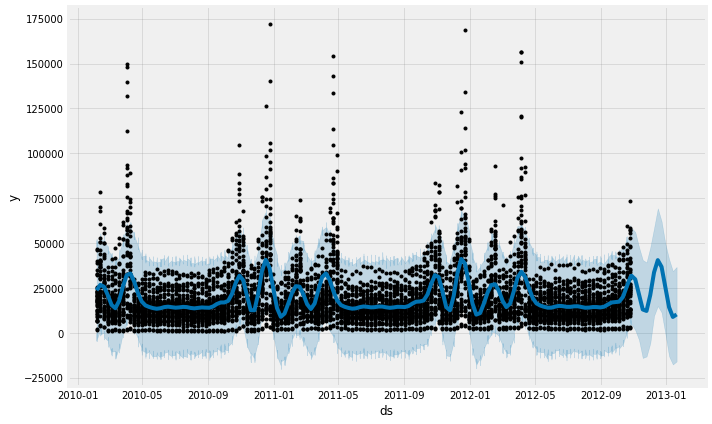

Model Intepretation


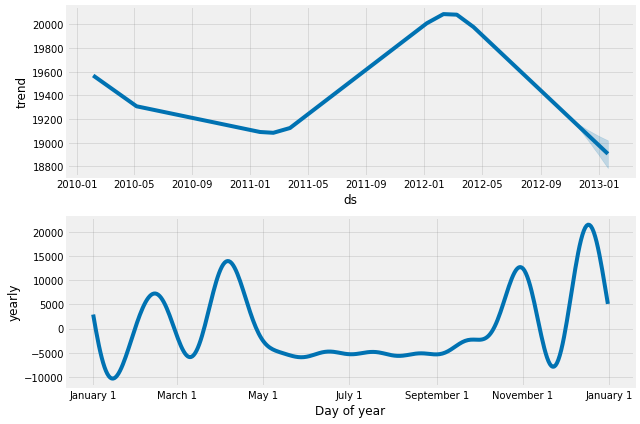

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Department: 2
             ds
6443 2012-12-23
6444 2012-12-30
6445 2013-01-06
6446 2013-01-13
6447 2013-01-20
             ds          yhat    yhat_lower     yhat_upper
6443 2012-12-23  51791.616852   2026.981076  100947.338795
6444 2012-12-30  47123.990529  -2572.745662   95725.303153
6445 2013-01-06  41448.376834  -6286.224907   89511.872955
6446 2013-01-13  38559.440443 -11418.799498   86783.127514
6447 2013-01-20  39403.469303  -9798.049712   91898.289703
Forcasting


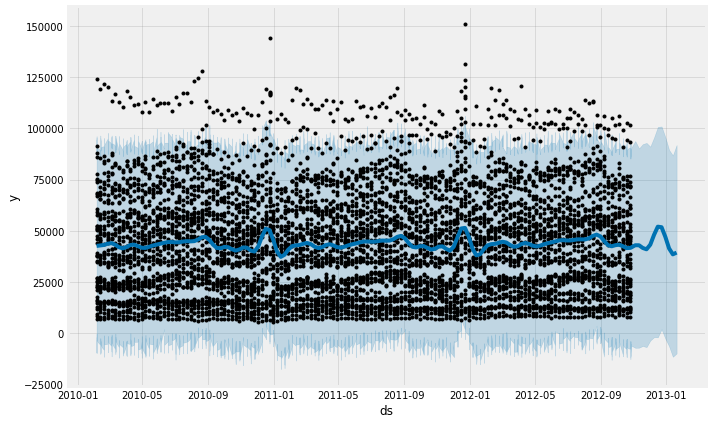

Model Intepretation


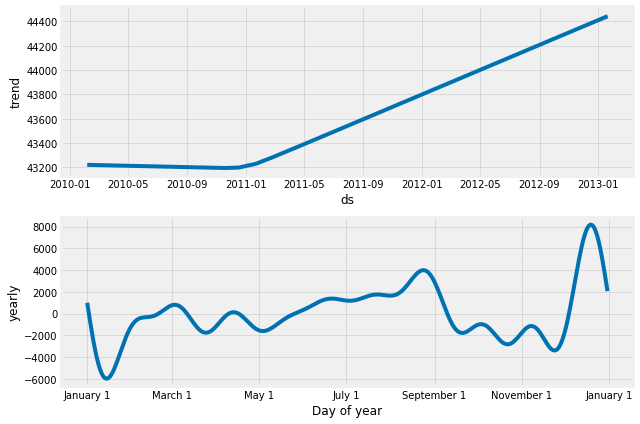

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Department: 3
             ds
6443 2012-12-23
6444 2012-12-30
6445 2013-01-06
6446 2013-01-13
6447 2013-01-20
             ds          yhat    yhat_lower    yhat_upper
6443 2012-12-23  13142.293903  -5730.619232  32943.214711
6444 2012-12-30  11548.235651  -9592.448650  31638.054570
6445 2013-01-06  10798.467650 -10189.152727  31295.069252
6446 2013-01-13  11399.718707 -10396.920762  30325.988632
6447 2013-01-20  12184.530662  -6051.016249  33793.548932
Forcasting


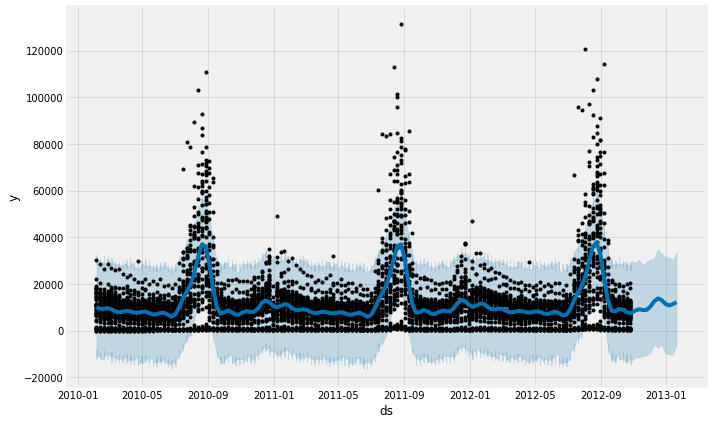

Model Intepretation


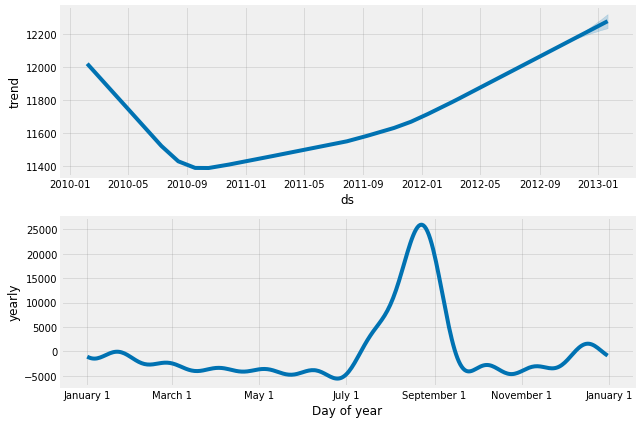

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Department: 4
             ds
6443 2012-12-23
6444 2012-12-30
6445 2013-01-06
6446 2013-01-13
6447 2013-01-20
             ds          yhat   yhat_lower    yhat_upper
6443 2012-12-23  28818.725854  4424.987726  56689.747991
6444 2012-12-30  28734.196315  5099.807915  53640.104160
6445 2013-01-06  27490.741057  1899.703120  54950.351265
6446 2013-01-13  25947.187713   806.582589  49616.776863
6447 2013-01-20  25192.465115   808.113075  51522.081489
Forcasting


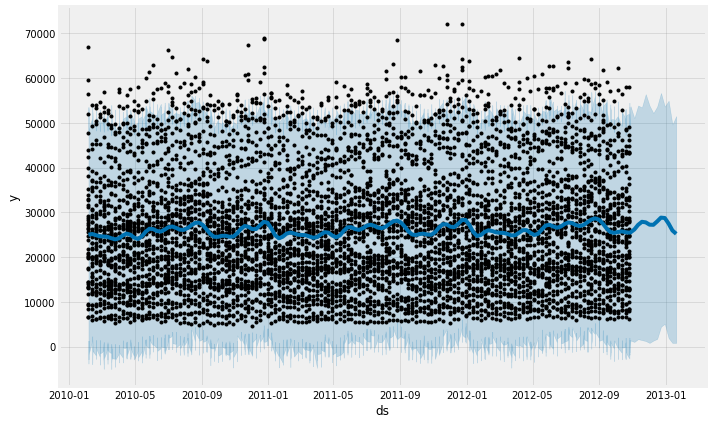

Model Intepretation


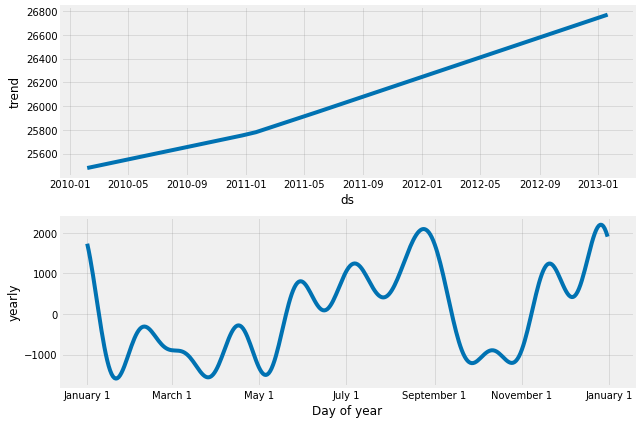

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Department: 5
             ds
6355 2012-12-23
6356 2012-12-30
6357 2013-01-06
6358 2013-01-13
6359 2013-01-20
             ds          yhat    yhat_lower    yhat_upper
6355 2012-12-23  54112.387947  19751.415108  88562.556757
6356 2012-12-30  42469.926681   9775.873398  77938.561739
6357 2013-01-06  25880.350946  -8379.461295  59360.468977
6358 2013-01-13  13574.686650 -20752.543111  48540.432922
6359 2013-01-20  11529.307107 -24979.437978  44938.908313
Forcasting


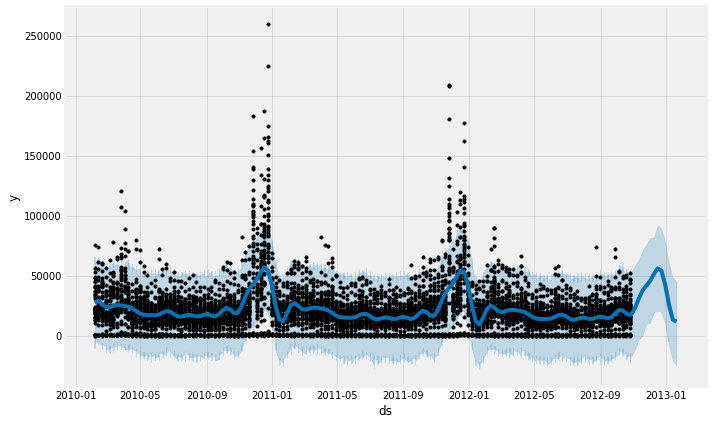

Model Intepretation


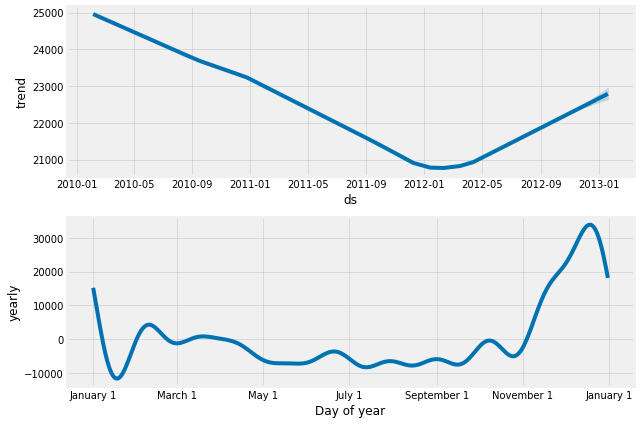

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Department: 6
             ds
5994 2012-12-23
5995 2012-12-30
5996 2013-01-06
5997 2013-01-13
5998 2013-01-20
             ds          yhat   yhat_lower    yhat_upper
5994 2012-12-23  10791.881995  2396.407886  18739.084560
5995 2012-12-30   8812.692334   964.256693  17117.931918
5996 2013-01-06   4839.129000 -3318.303238  12583.062761
5997 2013-01-13   1234.426192 -6338.269364   9274.943855
5998 2013-01-20    160.647459 -7890.905452   7624.924589
Forcasting


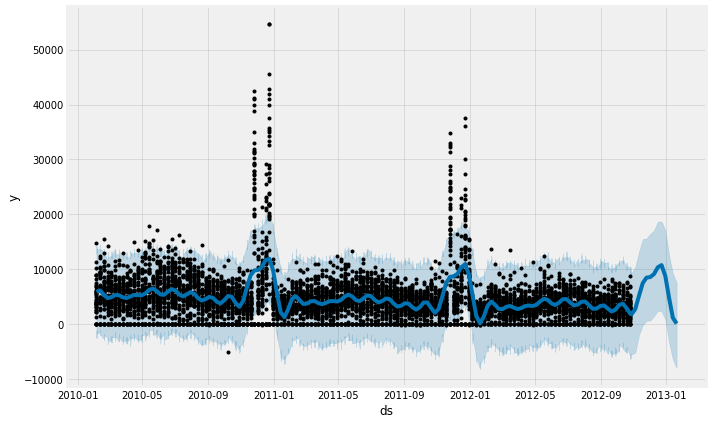

Model Intepretation


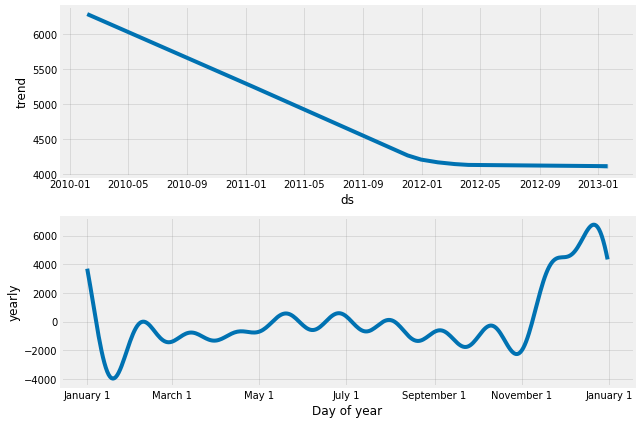

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Department: 7
             ds
6443 2012-12-23
6444 2012-12-30
6445 2013-01-06
6446 2013-01-13
6447 2013-01-20
             ds          yhat    yhat_lower     yhat_upper
6443 2012-12-23  87122.446853  41098.802311  133301.199093
6444 2012-12-30  58477.993628  11367.224238  107807.104335
6445 2013-01-06  24499.305812 -20558.735065   67646.998137
6446 2013-01-13   4212.306212 -42340.152607   50633.499777
6447 2013-01-20   4082.369138 -43382.156015   46259.653158
Forcasting


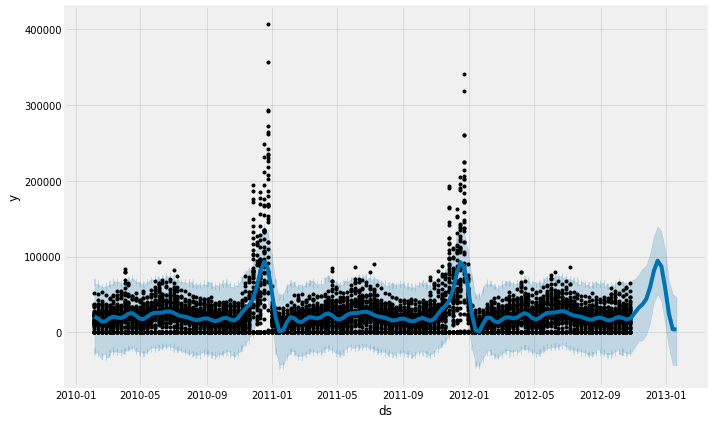

Model Intepretation


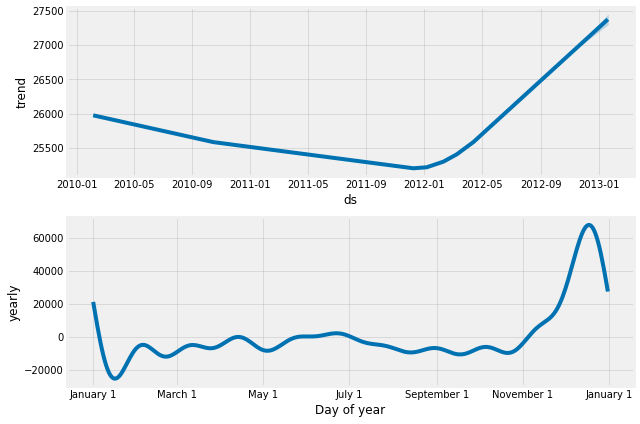

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Department: 8
             ds
6443 2012-12-23
6444 2012-12-30
6445 2013-01-06
6446 2013-01-13
6447 2013-01-20
             ds          yhat   yhat_lower    yhat_upper
6443 2012-12-23  35090.378216   841.324109  71825.013700
6444 2012-12-30  32433.006212 -3427.495634  64843.194772
6445 2013-01-06  29561.881998 -5241.424661  65054.700616
6446 2013-01-13  28499.838927 -8049.291572  64402.375215
6447 2013-01-20  29526.889528 -7630.757426  67012.002230
Forcasting


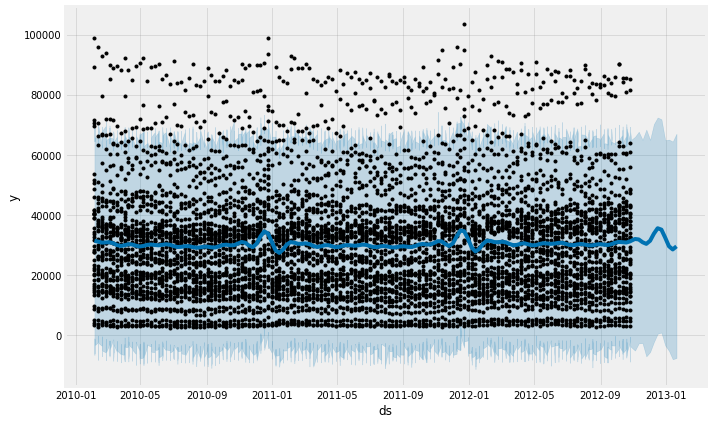

Model Intepretation


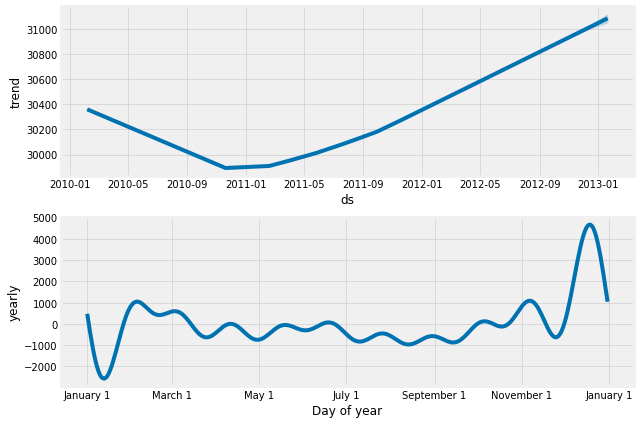

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Department: 9
             ds
6362 2012-12-23
6363 2012-12-30
6364 2013-01-06
6365 2013-01-13
6366 2013-01-20
             ds          yhat    yhat_lower    yhat_upper
6362 2012-12-23  23904.278373  -6627.580081  55087.001479
6363 2012-12-30  21274.883970 -11560.132418  49976.245464
6364 2013-01-06  15750.798177 -14412.819521  47462.308644
6365 2013-01-13  11042.744629 -21526.354571  43024.778259
6366 2013-01-20  10045.273217 -18523.613692  42411.711684
Forcasting


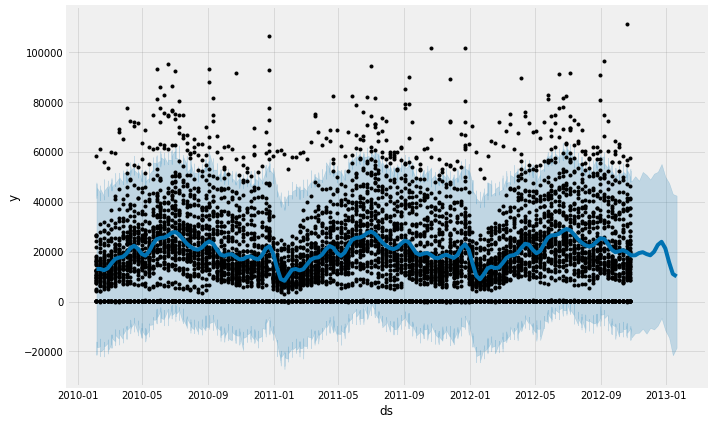

Model Intepretation


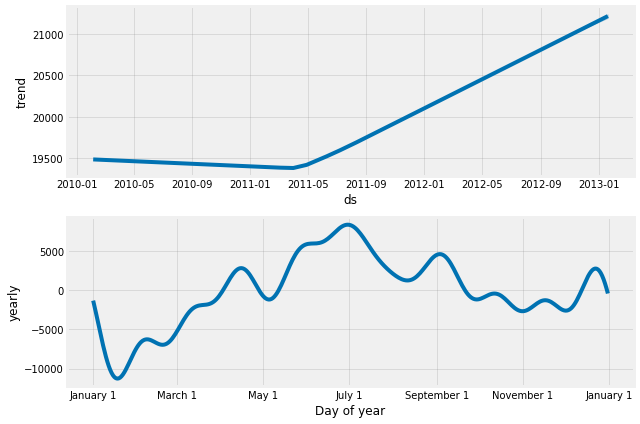

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Department: 10
             ds
6443 2012-12-23
6444 2012-12-30
6445 2013-01-06
6446 2013-01-13
6447 2013-01-20
             ds          yhat    yhat_lower    yhat_upper
6443 2012-12-23  21036.990601  -4065.266943  45471.657289
6444 2012-12-30  19312.606477  -6207.817946  44526.153245
6445 2013-01-06  16955.093927  -8679.813080  41861.701555
6446 2013-01-13  15396.187721 -11320.155184  40665.409286
6447 2013-01-20  15425.845642 -10217.925124  39985.761940
Forcasting


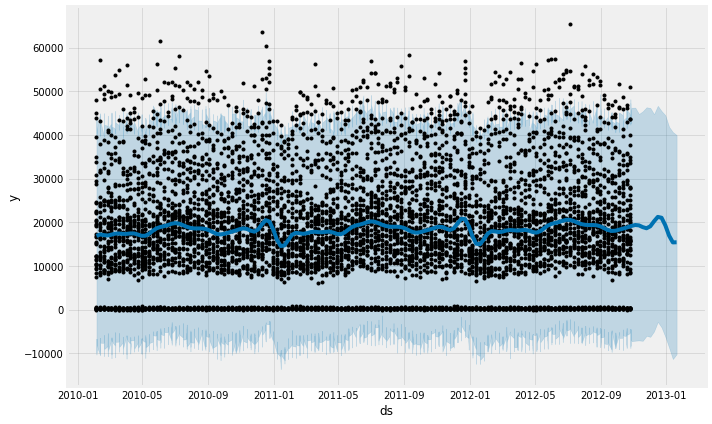

Model Intepretation


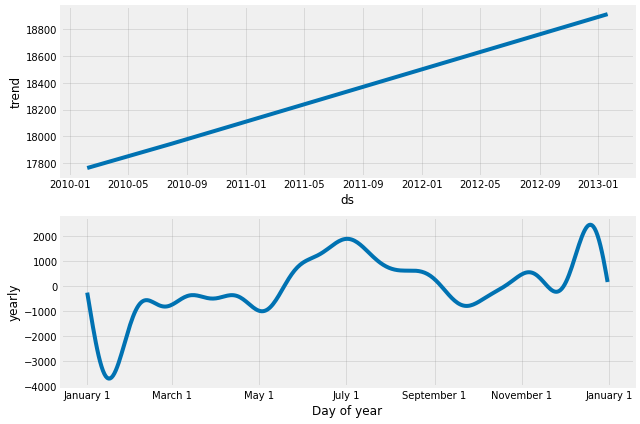

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Department: 11
             ds
6442 2012-12-23
6443 2012-12-30
6444 2013-01-06
6445 2013-01-13
6446 2013-01-20
             ds          yhat   yhat_lower    yhat_upper
6442 2012-12-23  17068.445260 -1036.108081  37050.391758
6443 2012-12-30  15644.510291 -4149.825860  33863.060250
6444 2013-01-06  14338.183430 -5716.225719  34623.762476
6445 2013-01-13  13267.196575 -6803.573682  32695.367848
6446 2013-01-20  12710.423823 -5507.598990  32887.110367
Forcasting


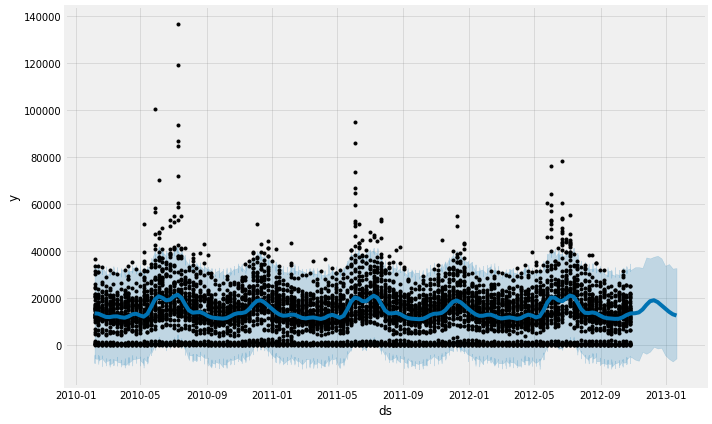

Model Intepretation


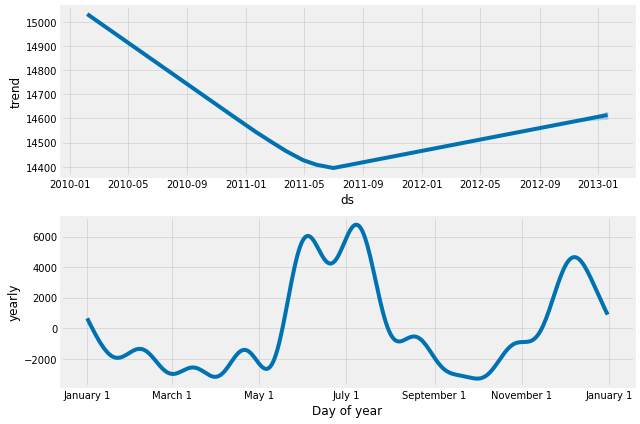

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Department: 12
             ds
6417 2012-12-23
6418 2012-12-30
6419 2013-01-06
6420 2013-01-13
6421 2013-01-20
             ds         yhat   yhat_lower   yhat_upper
6417 2012-12-23  2798.409689 -2408.381387  8508.618825
6418 2012-12-30  2760.495457 -2866.760275  8147.933147
6419 2013-01-06  2766.517282 -2809.052676  8320.215867
6420 2013-01-13  2826.138401 -2624.455864  7926.891970
6421 2013-01-20  2956.371880 -2550.465827  8587.957563
Forcasting


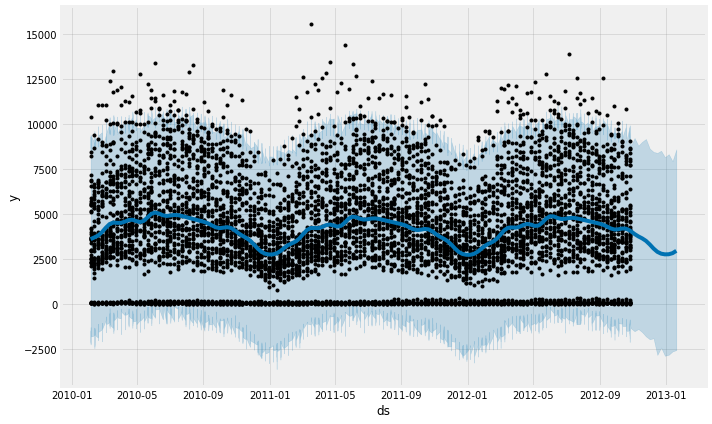

Model Intepretation


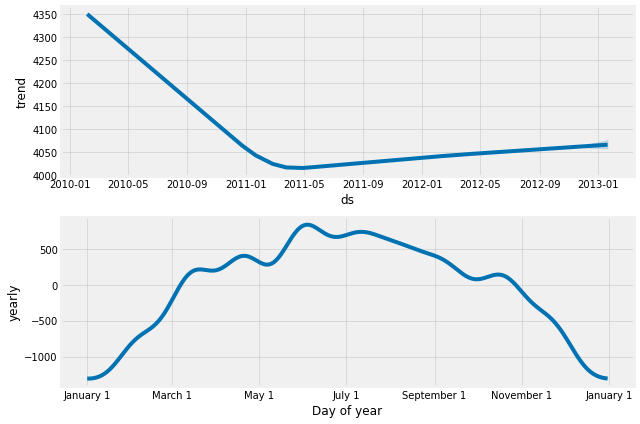

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Department: 13
             ds
6443 2012-12-23
6444 2012-12-30
6445 2013-01-06
6446 2013-01-13
6447 2013-01-20
             ds          yhat   yhat_lower    yhat_upper
6443 2012-12-23  28607.763786 -1809.392587  60303.616224
6444 2012-12-30  29000.853497 -4825.507673  61887.621113
6445 2013-01-06  29283.049975 -1149.516121  61264.733288
6446 2013-01-13  29387.687530 -2495.038551  61479.075753
6447 2013-01-20  29370.702628 -3713.149950  61146.744852
Forcasting


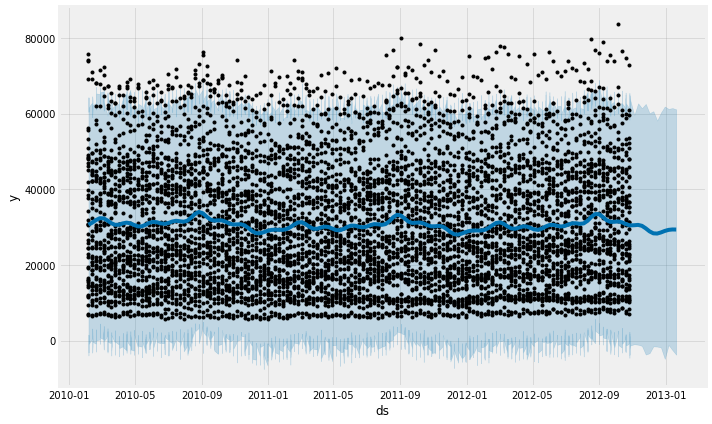

Model Intepretation


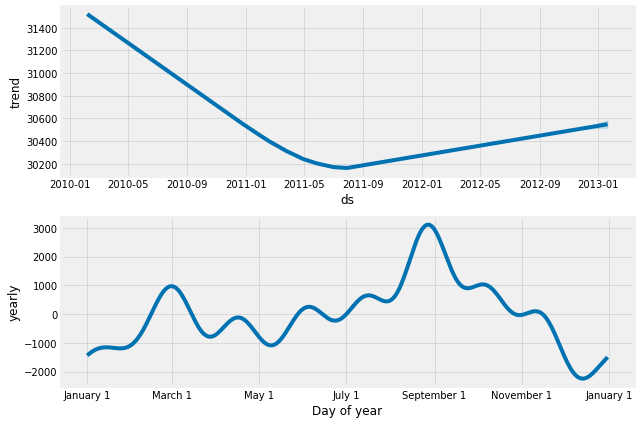

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Department: 14
             ds
6443 2012-12-23
6444 2012-12-30
6445 2013-01-06
6446 2013-01-13
6447 2013-01-20
             ds          yhat    yhat_lower    yhat_upper
6443 2012-12-23  31326.409233  10246.024659  52675.989013
6444 2012-12-30  26189.288439   6564.398727  45425.317960
6445 2013-01-06  17797.905875  -1573.618339  39965.966091
6446 2013-01-13  11259.423381 -10041.996813  34069.248782
6447 2013-01-20  10003.584894 -10916.039568  30100.842321
Forcasting


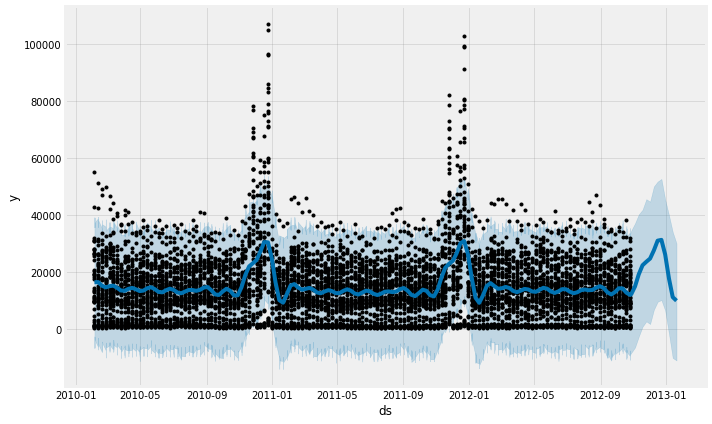

Model Intepretation


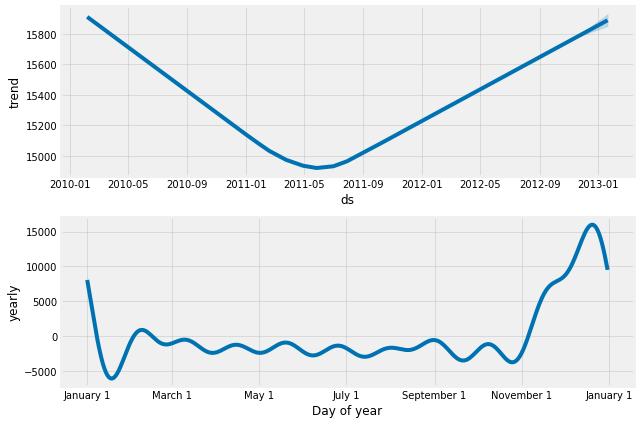

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Department: 16
             ds
6443 2012-12-23
6444 2012-12-30
6445 2013-01-06
6446 2013-01-13
6447 2013-01-20
             ds         yhat    yhat_lower    yhat_upper
6443 2012-12-23  2439.348754 -23343.869242  25858.869510
6444 2012-12-30  3066.268960 -20911.294670  27848.660612
6445 2013-01-06  3156.207408 -21414.115451  26921.825970
6446 2013-01-13  2781.476452 -20661.822256  26433.689695
6447 2013-01-20  2699.013867 -22117.639334  27736.364488
Forcasting


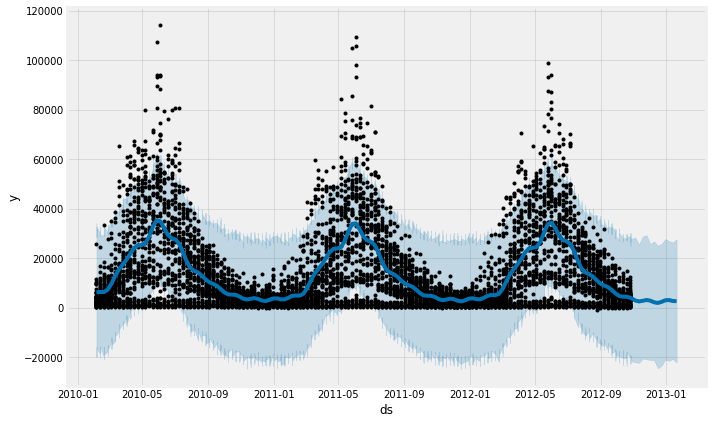

Model Intepretation


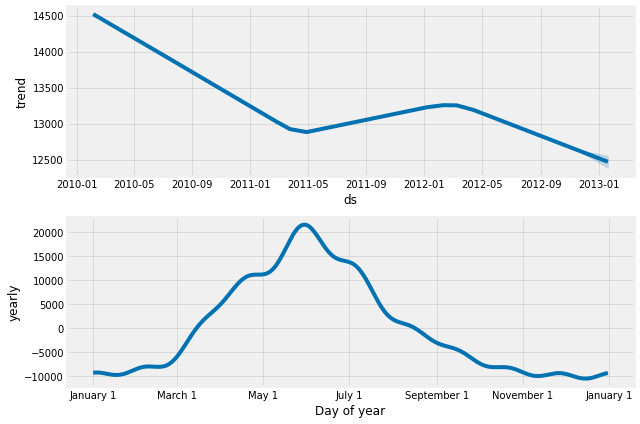

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Department: 17
             ds
6420 2012-12-23
6421 2012-12-30
6422 2013-01-06
6423 2013-01-13
6424 2013-01-20
             ds          yhat   yhat_lower    yhat_upper
6420 2012-12-23  15711.671604  2293.495275  29510.815612
6421 2012-12-30  13429.257626 -1276.982954  27728.062023
6422 2013-01-06  10307.560241 -4361.708475  24722.989334
6423 2013-01-13   8241.957368 -5870.310050  23334.395522
6424 2013-01-20   8110.852063 -6280.810710  21660.511041
Forcasting


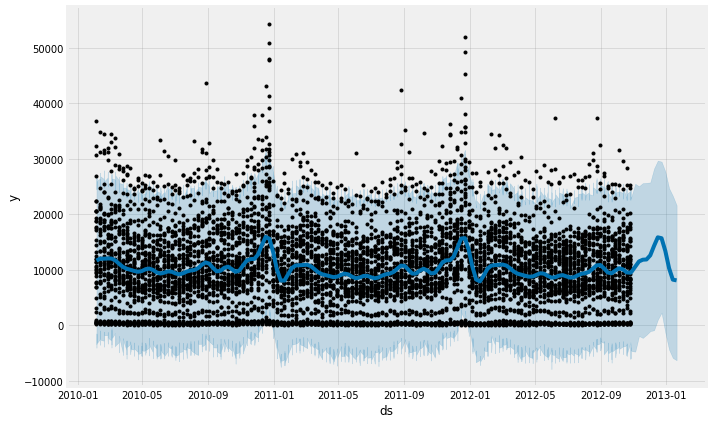

Model Intepretation


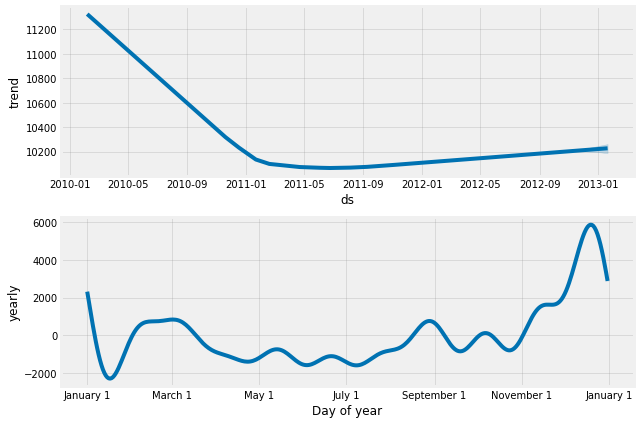

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Department: 18
             ds
5037 2012-12-23
5038 2012-12-30
5039 2013-01-06
5040 2013-01-13
5041 2013-01-20
             ds          yhat    yhat_lower    yhat_upper
5037 2012-12-23  25960.960191   6990.633339  43868.220871
5038 2012-12-30  14443.498534  -5782.267763  32429.528416
5039 2013-01-06   6779.849317 -11747.637846  27046.882861
5040 2013-01-13   2529.226452 -16872.912730  21033.143081
5041 2013-01-20    626.230422 -17156.799790  18192.297296
Forcasting


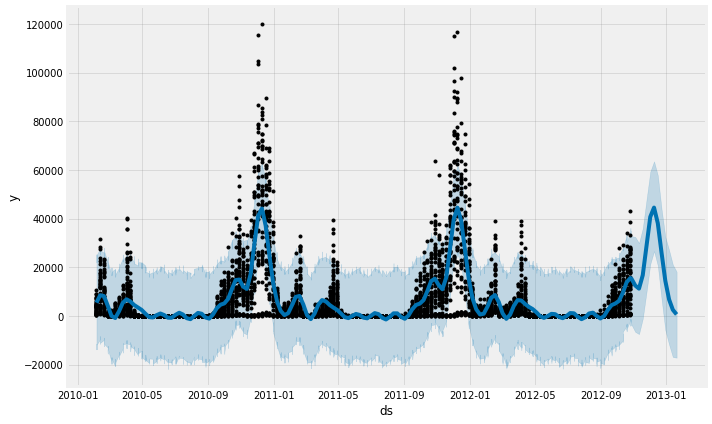

Model Intepretation


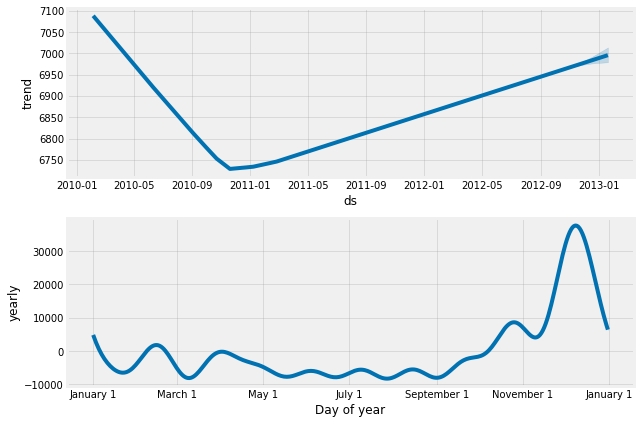

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Department: 19
             ds
4127 2012-12-23
4128 2012-12-30
4129 2013-01-06
4130 2013-01-13
4131 2013-01-20
             ds         yhat   yhat_lower   yhat_upper
4127 2012-12-23  1830.518973 -1003.880304  4635.258326
4128 2012-12-30  1496.953011 -1433.688484  4355.625773
4129 2013-01-06  1287.753571 -1701.874331  4040.774677
4130 2013-01-13  1269.621070 -1408.087843  3708.991418
4131 2013-01-20  1366.235516 -1494.311811  4216.876203
Forcasting


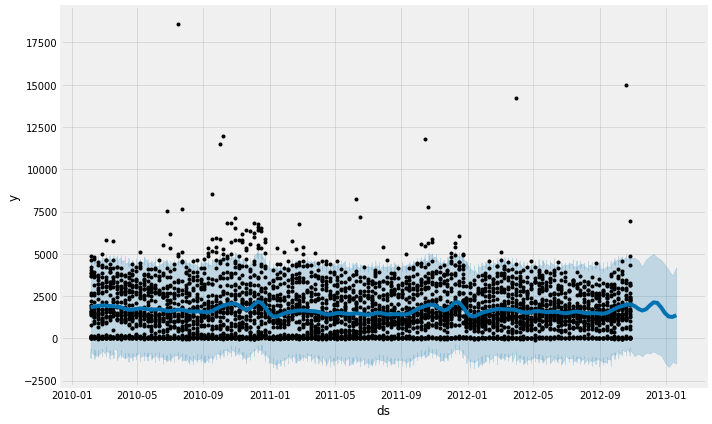

Model Intepretation


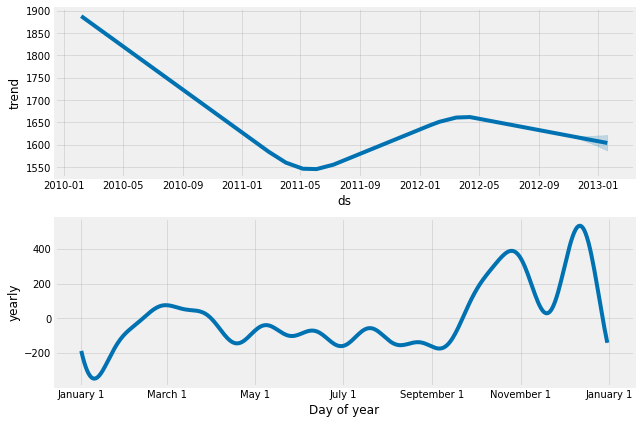

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Department: 20
             ds
6040 2012-12-23
6041 2012-12-30
6042 2013-01-06
6043 2013-01-13
6044 2013-01-20
             ds         yhat   yhat_lower    yhat_upper
6040 2012-12-23  5422.885646 -1956.137166  12461.378215
6041 2012-12-30  5464.830692 -1782.886576  12693.969770
6042 2013-01-06  5060.297867 -2642.449854  12044.085239
6043 2013-01-13  4511.120327 -2458.259695  11884.780776
6044 2013-01-20  4336.733065 -2873.656579  11981.015232
Forcasting


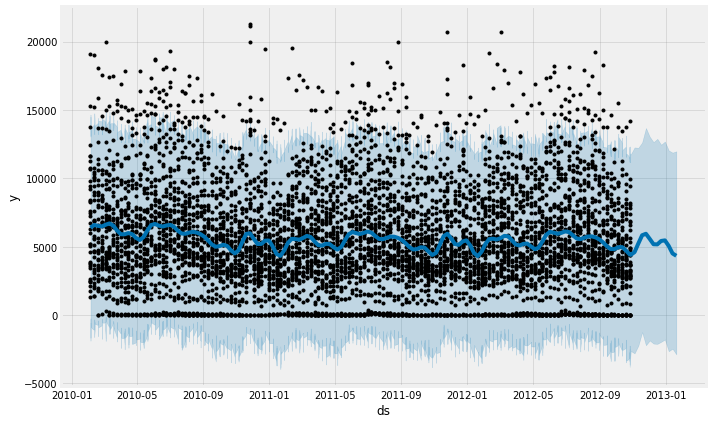

Model Intepretation


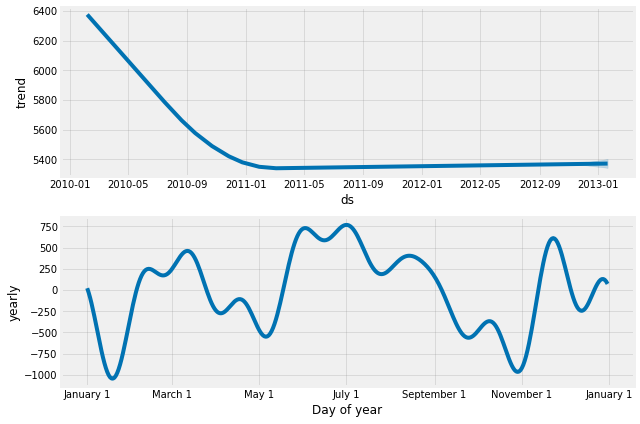

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Department: 21
             ds
6443 2012-12-23
6444 2012-12-30
6445 2013-01-06
6446 2013-01-13
6447 2013-01-20
             ds         yhat   yhat_lower    yhat_upper
6443 2012-12-23  7309.246367   997.783516  13833.166869
6444 2012-12-30  5867.822758  -265.035379  12253.611509
6445 2013-01-06  4174.138770 -2023.009515  10273.018689
6446 2013-01-13  3257.786154 -2669.266357   9418.030432
6447 2013-01-20  3390.072989 -3098.951902   9520.947680
Forcasting


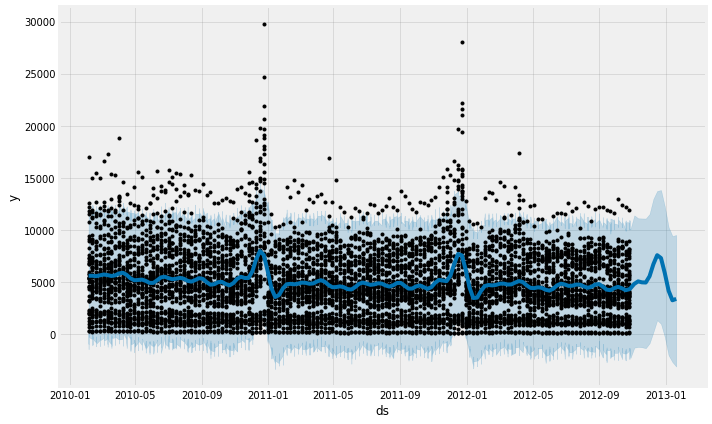

Model Intepretation


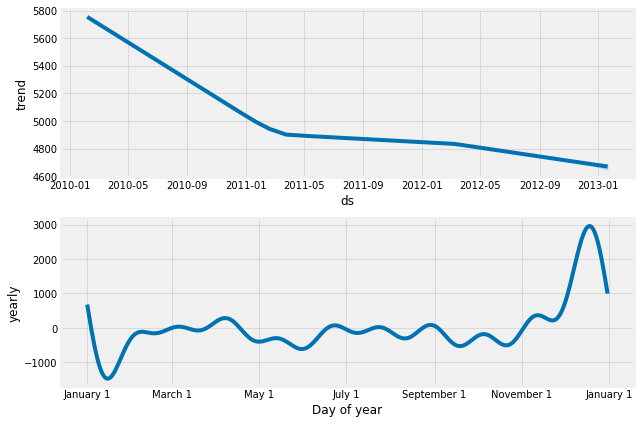

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Department: 22
             ds
5551 2012-12-23
5552 2012-12-30
5553 2013-01-06
5554 2013-01-13
5555 2013-01-20
             ds          yhat   yhat_lower    yhat_upper
5551 2012-12-23  15753.153151  3162.876737  28242.502130
5552 2012-12-30  13952.309259  2691.405797  25938.908427
5553 2013-01-06  10649.482582 -2098.679162  23613.968095
5554 2013-01-13   7840.364134 -5216.199864  20333.059016
5555 2013-01-20   7316.201378 -5423.081977  20782.953027
Forcasting


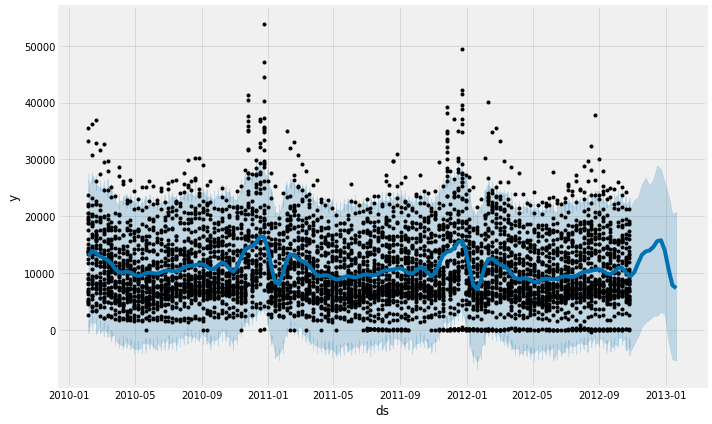

Model Intepretation


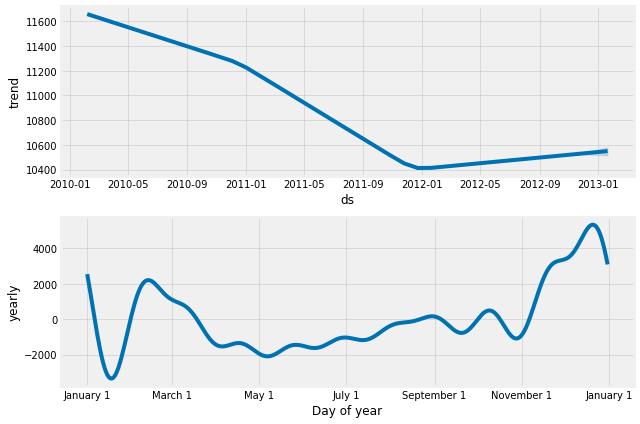

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Department: 23
             ds
5782 2012-12-23
5783 2012-12-30
5784 2013-01-06
5785 2013-01-13
5786 2013-01-20
             ds          yhat    yhat_lower    yhat_upper
5782 2012-12-23  44699.100295  14537.910735  75987.116299
5783 2012-12-30  34543.776341   5249.685378  64484.222242
5784 2013-01-06  22115.044180  -7673.722849  51550.773855
5785 2013-01-13  14717.028256 -13192.283270  45566.431645
5786 2013-01-20  14894.610360 -13898.569123  45382.402221
Forcasting


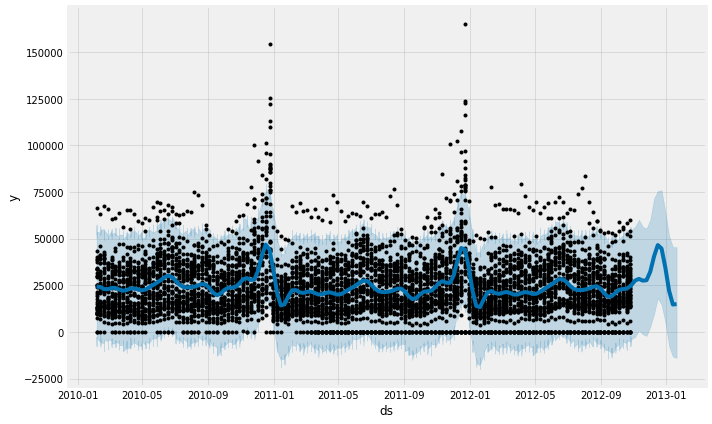

Model Intepretation


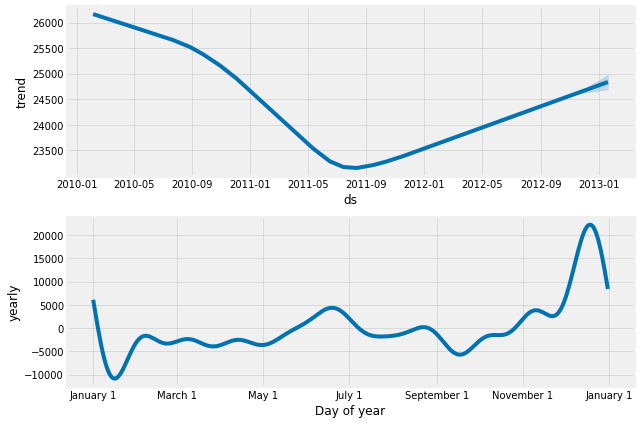

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Department: 24
             ds
5414 2012-12-23
5415 2012-12-30
5416 2013-01-06
5417 2013-01-13
5418 2013-01-20
             ds          yhat   yhat_lower    yhat_upper
5414 2012-12-23  10817.030157  3288.435682  18576.659563
5415 2012-12-30   7595.649347   -68.034801  15202.893069
5416 2013-01-06   4480.513561 -3077.192666  12817.383811
5417 2013-01-13   3010.349542 -4726.905696  10993.735372
5418 2013-01-20   3433.367355 -4894.736306  11085.258827
Forcasting


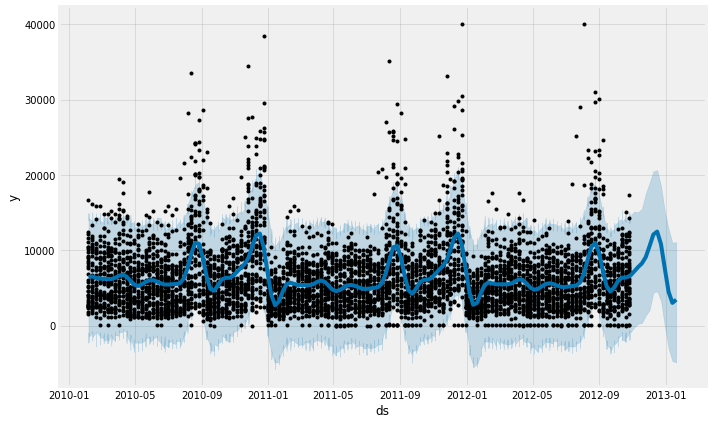

Model Intepretation


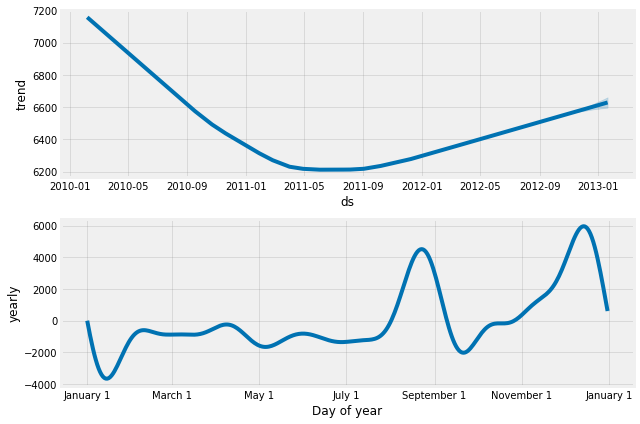

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Department: 25
             ds
6362 2012-12-23
6363 2012-12-30
6364 2013-01-06
6365 2013-01-13
6366 2013-01-20
             ds          yhat   yhat_lower    yhat_upper
6362 2012-12-23  12195.908979   310.397833  24648.610085
6363 2012-12-30  10072.027007 -2735.283257  22282.566888
6364 2013-01-06   7442.366324 -3987.553305  18574.939419
6365 2013-01-13   5847.924679 -6662.102099  18061.706592
6366 2013-01-20   5923.017492 -6446.981209  17749.214725
Forcasting


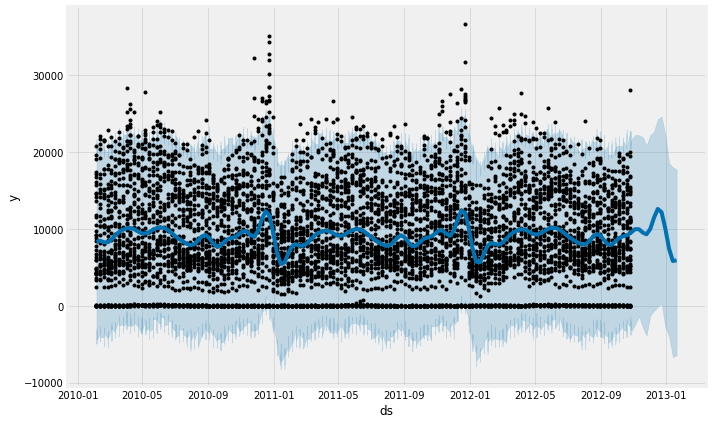

Model Intepretation


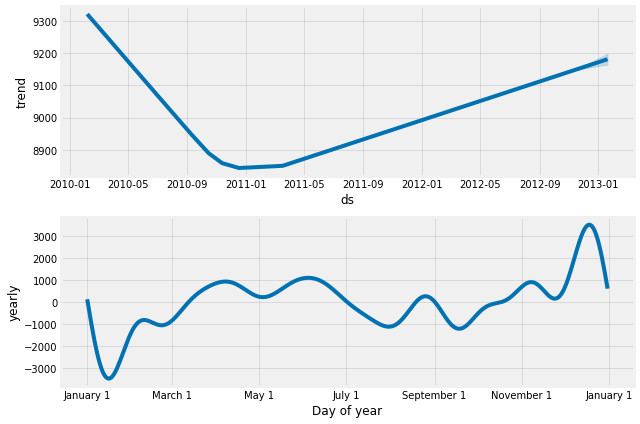

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Department: 26
             ds
5747 2012-12-23
5748 2012-12-30
5749 2013-01-06
5750 2013-01-13
5751 2013-01-20
             ds          yhat   yhat_lower    yhat_upper
5747 2012-12-23  10331.985210    76.044126  20397.462054
5748 2012-12-30   7704.545527 -2485.551432  17114.917295
5749 2013-01-06   4948.519232 -3922.646431  15563.397569
5750 2013-01-13   3606.065435 -5363.784797  13326.871723
5751 2013-01-20   4206.515215 -4943.812304  14051.394388
Forcasting


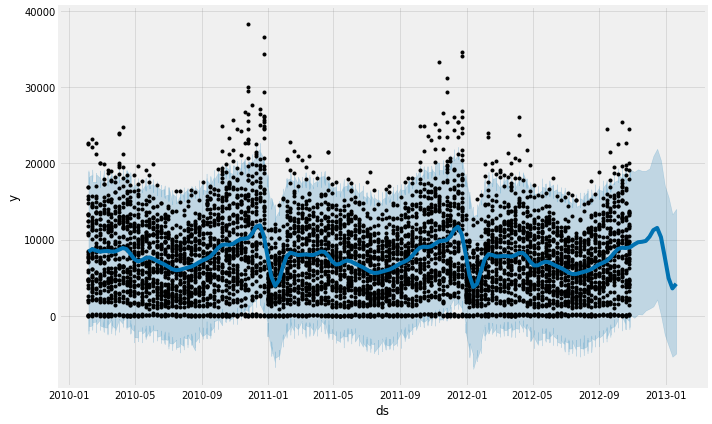

Model Intepretation


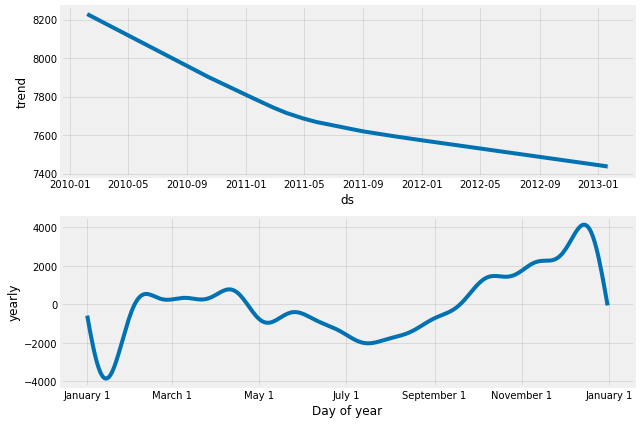

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Department: 27
             ds
5627 2012-12-23
5628 2012-12-30
5629 2013-01-06
5630 2013-01-13
5631 2013-01-20
             ds         yhat   yhat_lower   yhat_upper
5627 2012-12-23  3930.302335  2049.987551  5906.592351
5628 2012-12-30  3121.700568  1226.921070  5099.675131
5629 2013-01-06  2110.970965   159.391312  4067.010920
5630 2013-01-13  1511.845066  -576.155704  3478.152942
5631 2013-01-20  1528.288933  -435.913885  3542.413074
Forcasting


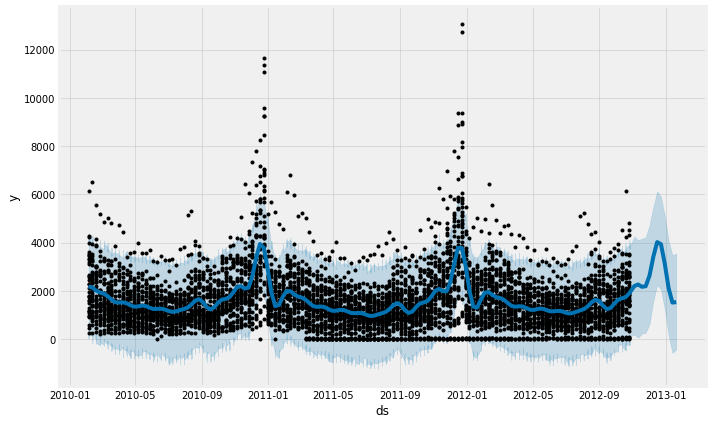

Model Intepretation


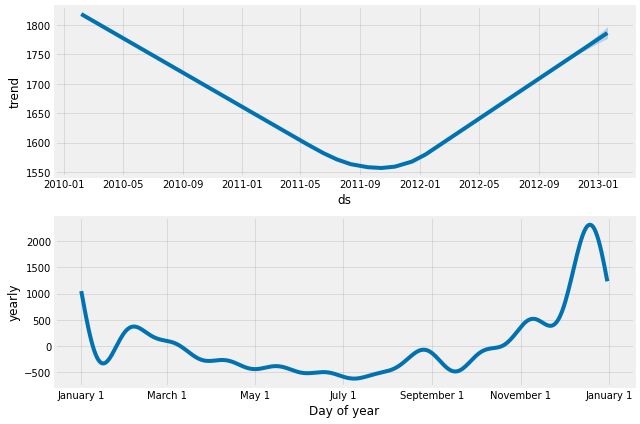

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Department: 28
             ds
6132 2012-12-23
6133 2012-12-30
6134 2013-01-06
6135 2013-01-13
6136 2013-01-20
             ds        yhat  yhat_lower   yhat_upper
6132 2012-12-23  931.637475   93.548298  1719.689563
6133 2012-12-30  770.555822  -74.948537  1554.577078
6134 2013-01-06  636.150557 -171.032387  1480.382080
6135 2013-01-13  591.819626 -227.899195  1442.307015
6136 2013-01-20  617.940829 -173.626824  1388.639527
Forcasting


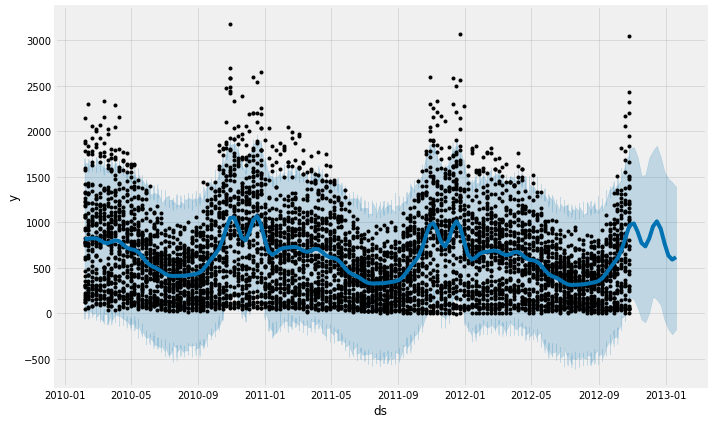

Model Intepretation


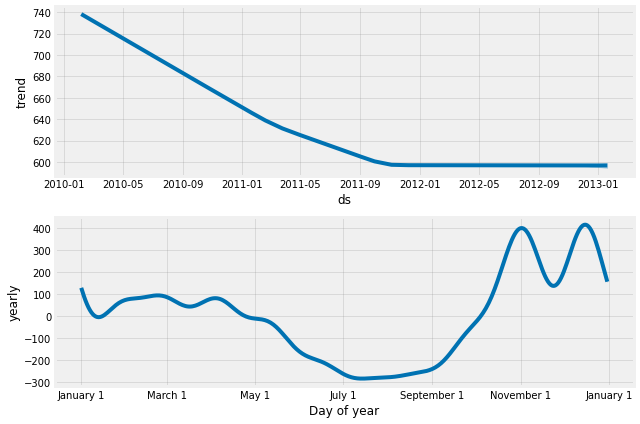

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Department: 29
             ds
5316 2012-12-23
5317 2012-12-30
5318 2013-01-06
5319 2013-01-13
5320 2013-01-20
             ds          yhat   yhat_lower    yhat_upper
5316 2012-12-23  11227.059670  4543.362728  17717.241794
5317 2012-12-30   9111.951216  1929.526880  15534.240287
5318 2013-01-06   6096.602701  -276.171206  13362.690736
5319 2013-01-13   4046.207670 -3063.414800  10599.422650
5320 2013-01-20   3923.364564 -2868.798916  11062.149871
Forcasting


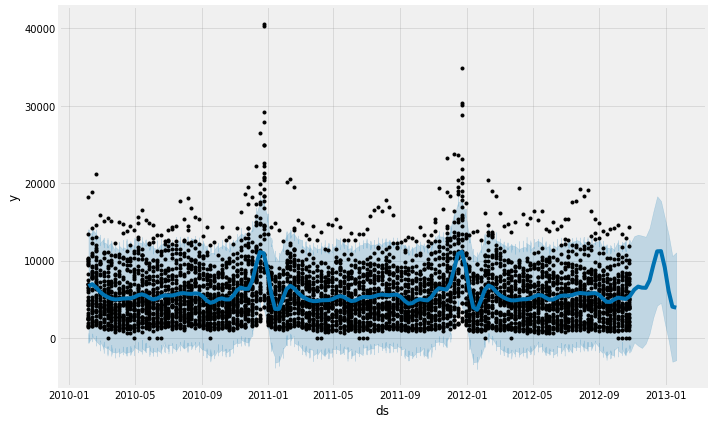

Model Intepretation


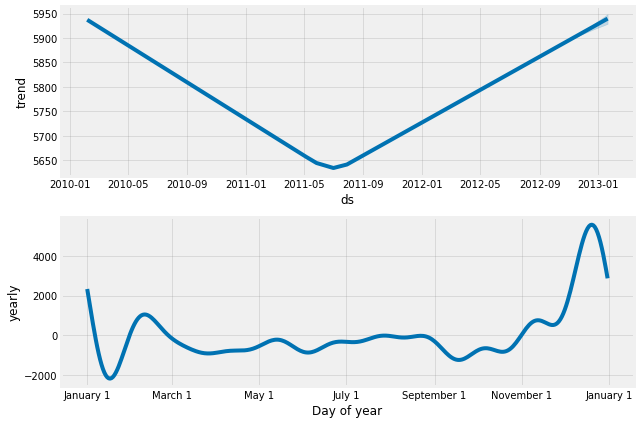

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Department: 30
             ds
5299 2012-12-23
5300 2012-12-30
5301 2013-01-06
5302 2013-01-13
5303 2013-01-20
             ds         yhat   yhat_lower   yhat_upper
5299 2012-12-23  3374.455273 -1372.277455  8149.502970
5300 2012-12-30  3197.935094 -1215.698474  8045.120443
5301 2013-01-06  2747.013053 -1644.014964  7430.749478
5302 2013-01-13  2358.433849 -2068.635633  7005.988295
5303 2013-01-20  2370.553623 -2188.072205  6976.829599
Forcasting


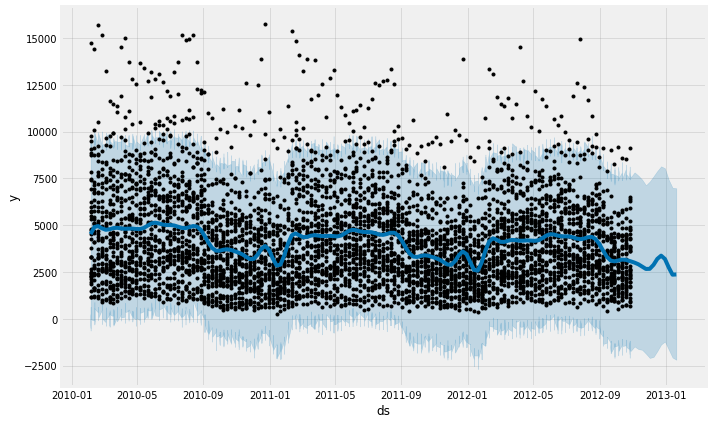

Model Intepretation


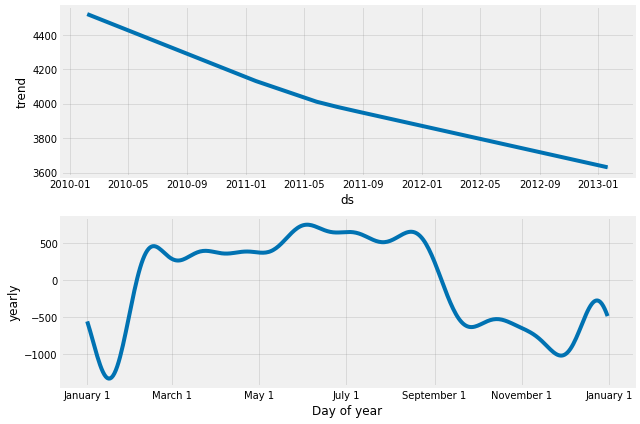

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Department: 31
             ds
6075 2012-12-23
6076 2012-12-30
6077 2013-01-06
6078 2013-01-13
6079 2013-01-20
             ds         yhat   yhat_lower   yhat_upper
6075 2012-12-23  4296.867711   937.940141  7809.298331
6076 2012-12-30  3123.379742  -674.067007  6636.677354
6077 2013-01-06  1868.844907 -1531.089795  5334.682926
6078 2013-01-13  1264.421414 -2407.559090  4424.421914
6079 2013-01-20  1372.927548 -2173.828957  4969.569081
Forcasting


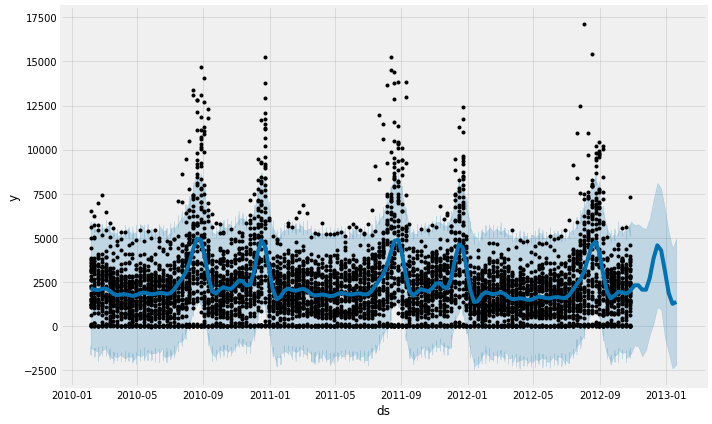

Model Intepretation


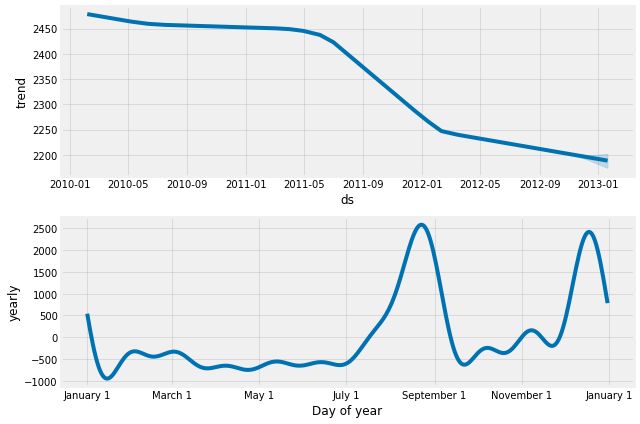

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Department: 32
             ds
5964 2012-12-23
5965 2012-12-30
5966 2013-01-06
5967 2013-01-13
5968 2013-01-20
             ds          yhat   yhat_lower    yhat_upper
5964 2012-12-23  19138.403587  8332.967763  29054.557266
5965 2012-12-30  14788.664431  4496.297856  25139.188103
5966 2013-01-06   7511.598043 -3144.118800  17705.241091
5967 2013-01-13   1979.117775 -9025.274727  12076.095288
5968 2013-01-20   1090.198538 -8888.944058  11140.060897
Forcasting


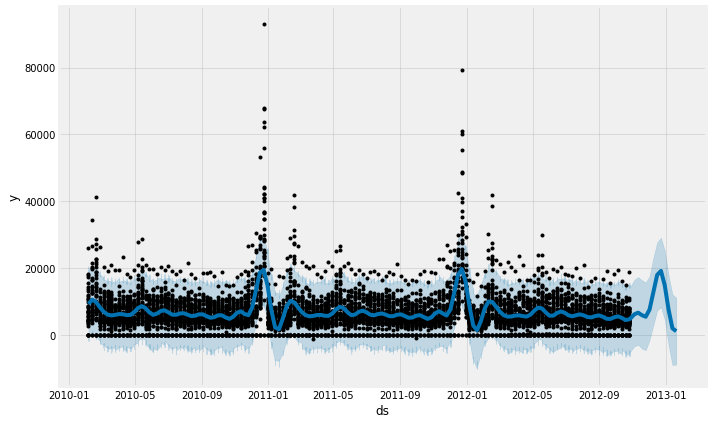

Model Intepretation


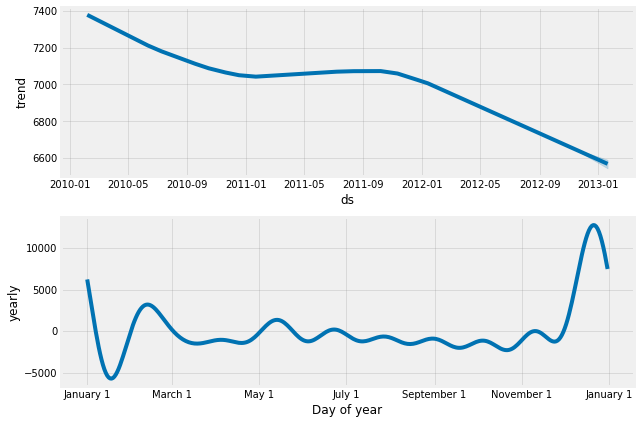

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Department: 33
             ds
5398 2012-12-23
5399 2012-12-30
5400 2013-01-06
5401 2013-01-13
5402 2013-01-20
             ds          yhat   yhat_lower    yhat_upper
5398 2012-12-23  11465.324284  4169.721484  19761.065725
5399 2012-12-30   8272.671837   934.396483  16156.941282
5400 2013-01-06   4829.298590 -2549.878128  12300.526812
5401 2013-01-13   2958.559304 -4881.721869  10360.251873
5402 2013-01-20   3300.320153 -4981.039569  10959.112981
Forcasting


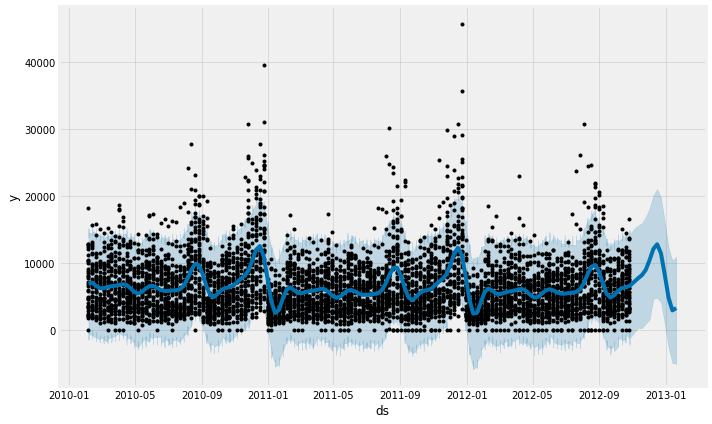

Model Intepretation


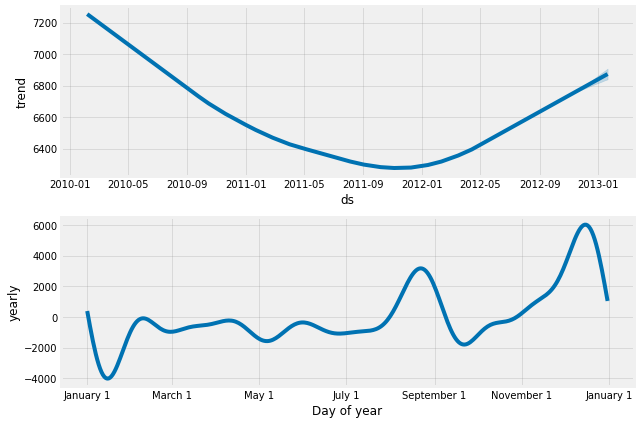

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Department: 34
             ds
5334 2012-12-23
5335 2012-12-30
5336 2013-01-06
5337 2013-01-13
5338 2013-01-20
             ds          yhat   yhat_lower    yhat_upper
5334 2012-12-23  18523.393335  1123.956000  35514.091603
5335 2012-12-30  16235.420909  -688.782469  33537.243623
5336 2013-01-06  12911.462260 -3833.349667  28276.850920
5337 2013-01-13  10496.450167 -6095.256578  26602.763128
5338 2013-01-20  10415.017202 -5720.431194  27403.620842
Forcasting


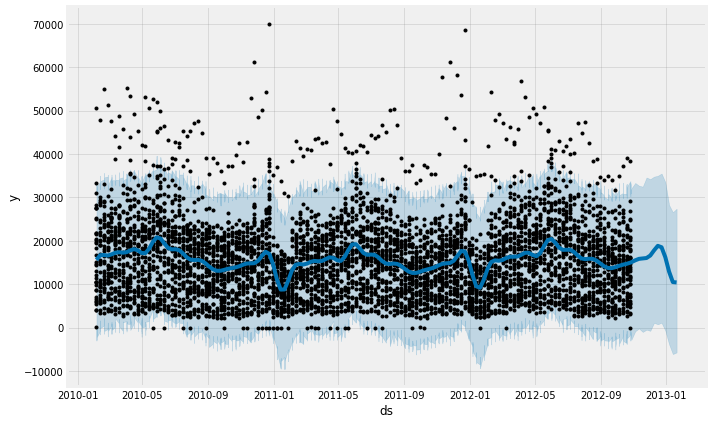

Model Intepretation


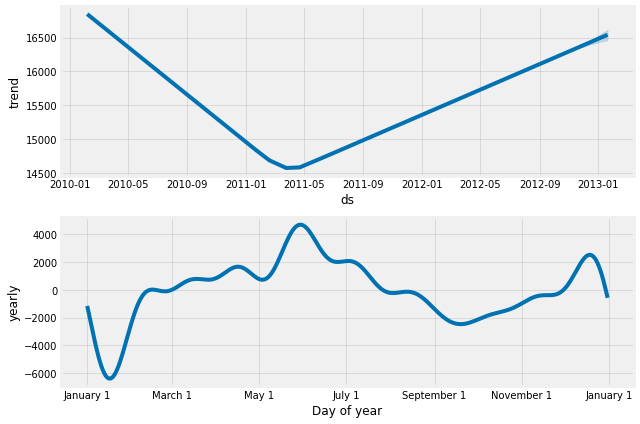

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Department: 35
             ds
5305 2012-12-23
5306 2012-12-30
5307 2013-01-06
5308 2013-01-13
5309 2013-01-20
             ds         yhat   yhat_lower   yhat_upper
5305 2012-12-23  3240.476516  -238.598549  6313.421771
5306 2012-12-30  2626.121547  -715.744824  6082.433740
5307 2013-01-06  1819.507862 -1563.193533  5124.966079
5308 2013-01-13  1299.740767 -1889.876663  4961.956015
5309 2013-01-20  1331.621850 -1898.917705  4688.656771
Forcasting


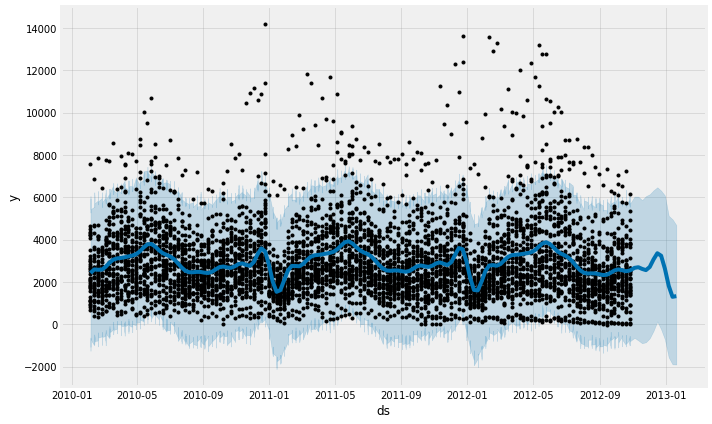

Model Intepretation


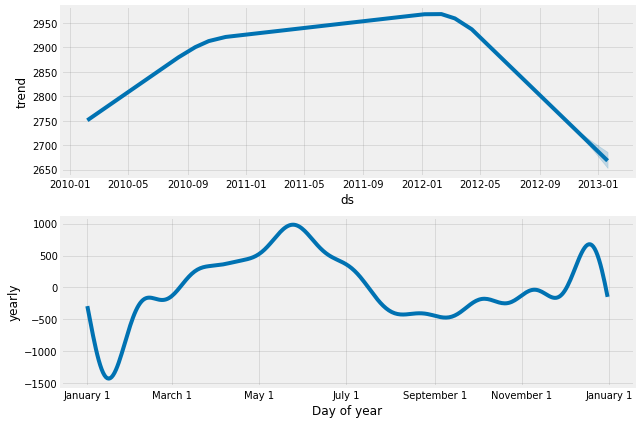

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Department: 36
             ds
5303 2012-12-23
5304 2012-12-30
5305 2013-01-06
5306 2013-01-13
5307 2013-01-20
             ds         yhat   yhat_lower   yhat_upper
5303 2012-12-23  2562.954978  -214.019583  5467.097973
5304 2012-12-30  1927.539777 -1079.704961  4875.687392
5305 2013-01-06  1011.593738 -2044.701884  3841.206935
5306 2013-01-13   341.572470 -2551.060450  3304.047751
5307 2013-01-20   287.004151 -2554.969477  3084.887408
Forcasting


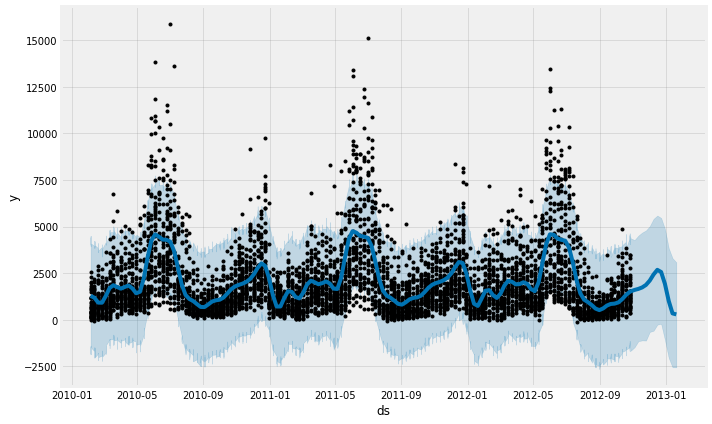

Model Intepretation


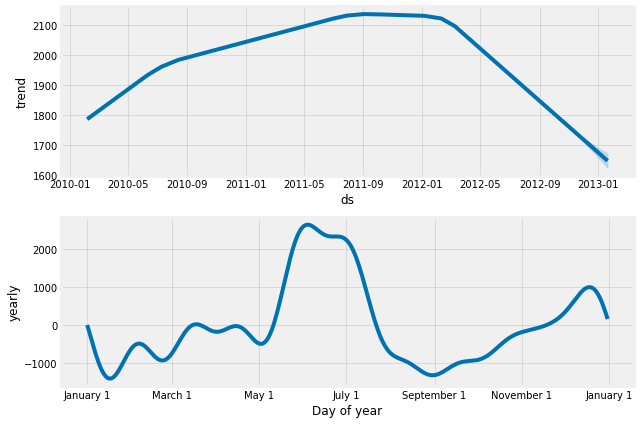

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Department: 37
             ds
2585 2012-12-23
2586 2012-12-30
2587 2013-01-06
2588 2013-01-13
2589 2013-01-20
             ds         yhat   yhat_lower   yhat_upper
2585 2012-12-23  3133.513169  1522.391184  4880.138091
2586 2012-12-30  3031.898108  1317.181372  4873.388297
2587 2013-01-06  2904.373982  1210.798241  4647.823065
2588 2013-01-13  2814.051082  1078.235519  4414.034102
2589 2013-01-20  2820.428793  1051.974619  4514.427520
Forcasting


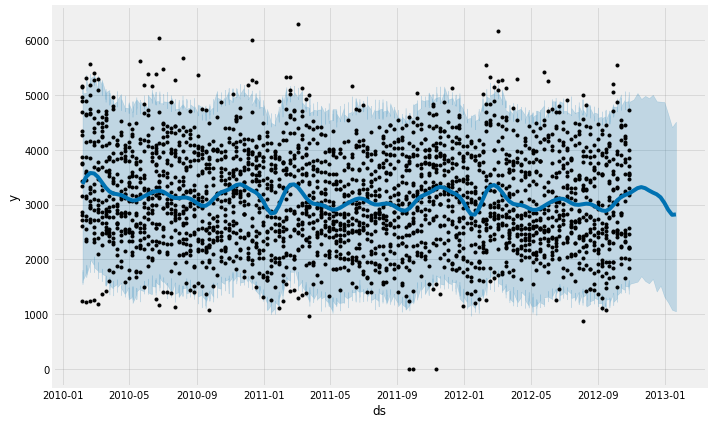

Model Intepretation


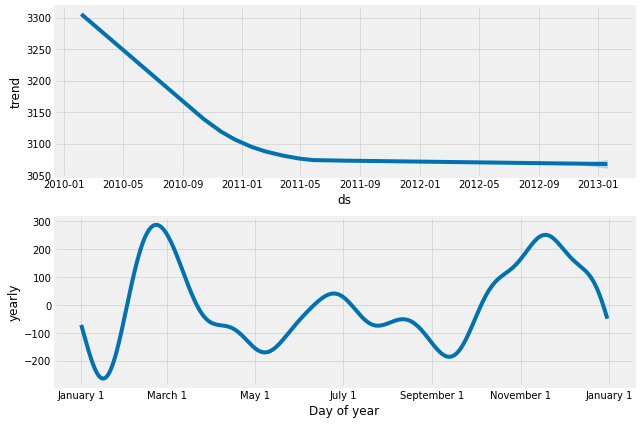

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Department: 38
             ds
6443 2012-12-23
6444 2012-12-30
6445 2013-01-06
6446 2013-01-13
6447 2013-01-20
             ds          yhat    yhat_lower     yhat_upper
6443 2012-12-23  59936.393526  13138.822073  103623.154047
6444 2012-12-30  59741.595001  16374.182078  106382.920725
6445 2013-01-06  62020.511777  16254.670449  112861.753077
6446 2013-01-13  65104.936947  15437.909556  112354.789994
6447 2013-01-20  66372.053157  19214.431856  108046.879242
Forcasting


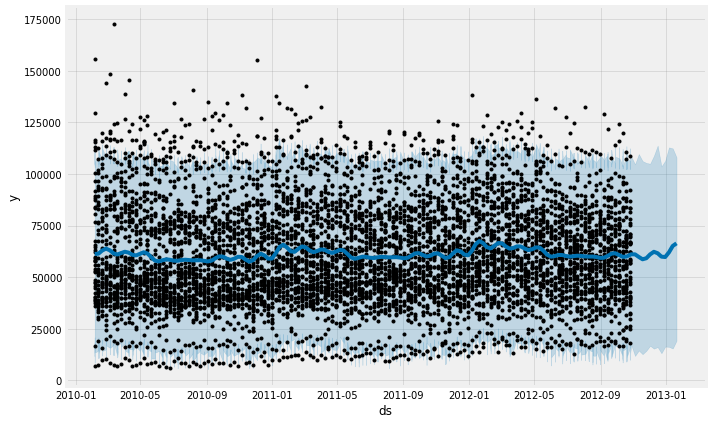

Model Intepretation


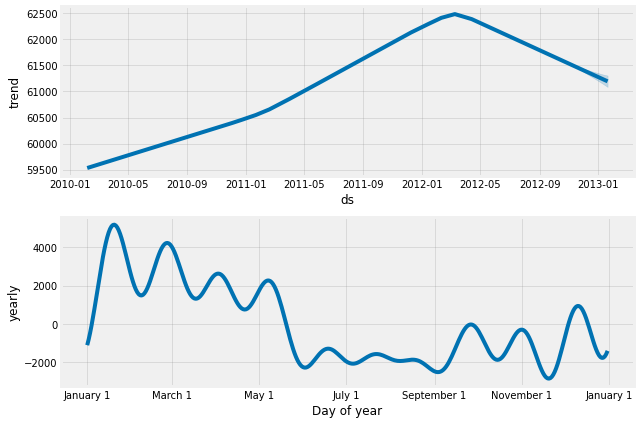

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Department: 40
             ds
6443 2012-12-23
6444 2012-12-30
6445 2013-01-06
6446 2013-01-13
6447 2013-01-20
             ds          yhat   yhat_lower    yhat_upper
6443 2012-12-23  49117.679573  6780.302113  92655.862818
6444 2012-12-30  48728.524526  6982.531966  92065.205480
6445 2013-01-06  48130.697090  6514.938116  91586.863731
6446 2013-01-13  47960.691743  9545.729606  89019.996953
6447 2013-01-20  48292.005387  6901.712528  90268.323156
Forcasting


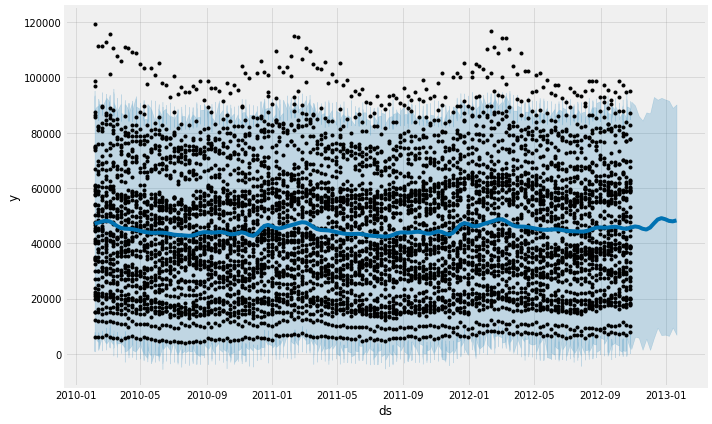

Model Intepretation


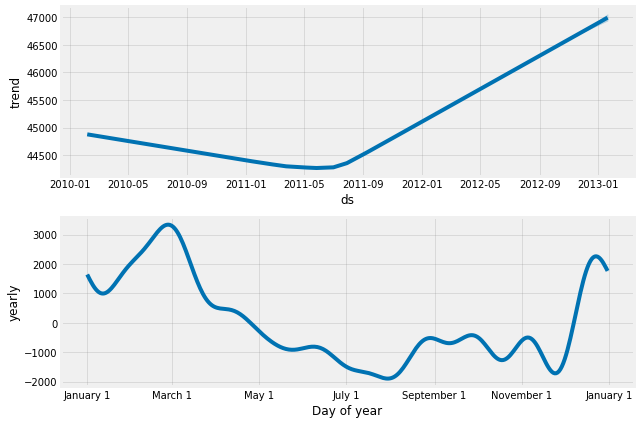

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Department: 41
             ds
5401 2012-12-23
5402 2012-12-30
5403 2013-01-06
5404 2013-01-13
5405 2013-01-20
             ds         yhat   yhat_lower   yhat_upper
5401 2012-12-23  4632.659493  -178.593672  9696.376919
5402 2012-12-30  3138.651543 -1921.166228  7874.059249
5403 2013-01-06  1298.619473 -3755.895273  6357.883866
5404 2013-01-13   307.176997 -4198.808510  5730.011199
5405 2013-01-20   561.352156 -4274.945052  5405.271261
Forcasting


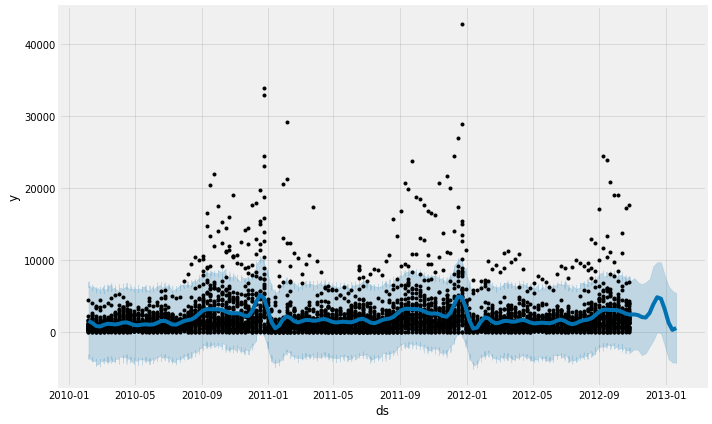

Model Intepretation


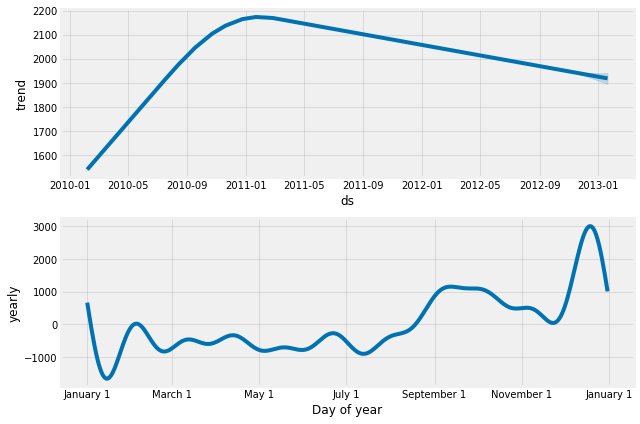

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Department: 42
             ds
6409 2012-12-23
6410 2012-12-30
6411 2013-01-06
6412 2013-01-13
6413 2013-01-20
             ds         yhat   yhat_lower    yhat_upper
6409 2012-12-23  4917.121775 -1574.047292  11143.072948
6410 2012-12-30  4922.131744 -1539.549742  10860.611934
6411 2013-01-06  4841.176462 -1338.200734  11227.687927
6412 2013-01-13  4751.322181 -1347.318775  10928.417938
6413 2013-01-20  4752.995809 -1746.304370  11383.564099
Forcasting


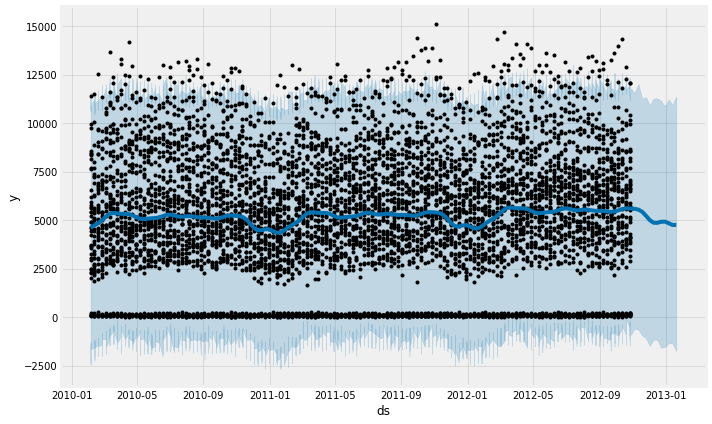

Model Intepretation


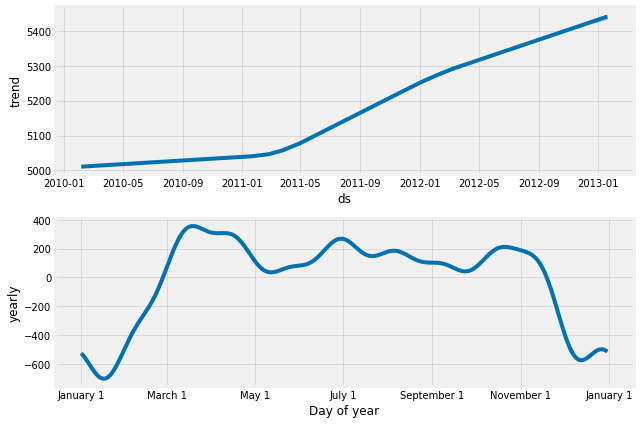

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Department: 44
             ds
5479 2012-12-23
5480 2012-12-30
5481 2013-01-06
5482 2013-01-13
5483 2013-01-20
             ds         yhat   yhat_lower    yhat_upper
5479 2012-12-23  7561.005628  3098.669708  12345.335288
5480 2012-12-30  5691.068162  1218.552700  10589.992958
5481 2013-01-06  4060.755567  -615.164479   8652.710966
5482 2013-01-13  3454.759680 -1415.360019   8404.824554
5483 2013-01-20  3855.540409  -751.263647   8424.852503
Forcasting


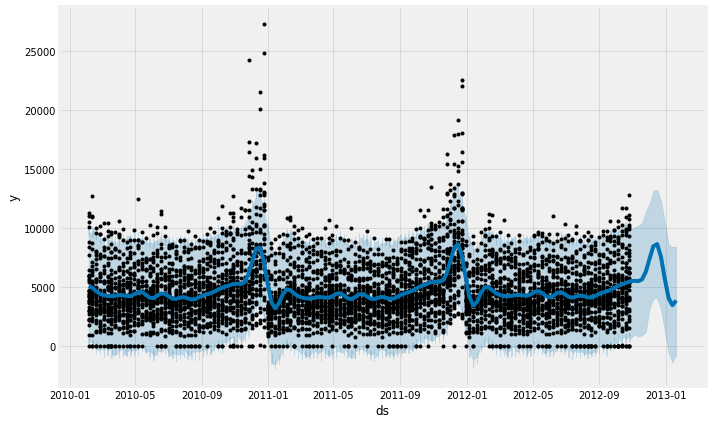

Model Intepretation


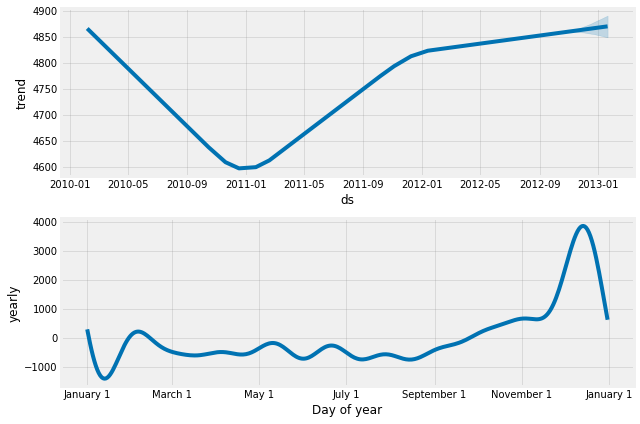

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Department: 45
             ds
1944 2012-12-23
1945 2012-12-30
1946 2013-01-06
1947 2013-01-13
1948 2013-01-20
             ds       yhat  yhat_lower  yhat_upper
1944 2012-12-23  22.938009  -26.608220   70.577061
1945 2012-12-30  23.417963  -23.185344   74.050521
1946 2013-01-06  23.968861  -23.655238   72.696279
1947 2013-01-13  24.648097  -21.637262   76.068935
1948 2013-01-20  24.866702  -23.560121   76.658101
Forcasting


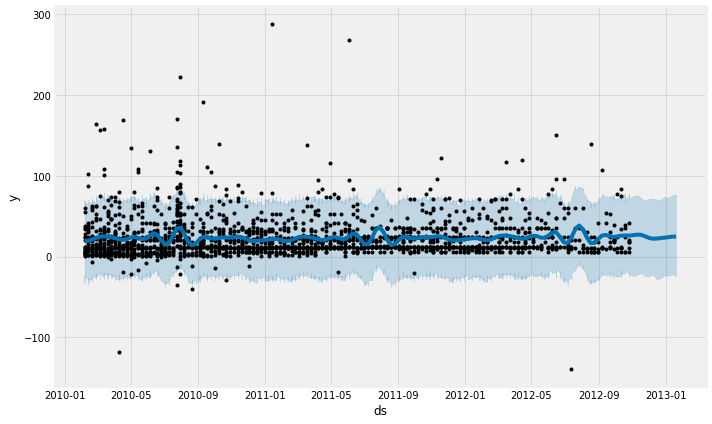

Model Intepretation


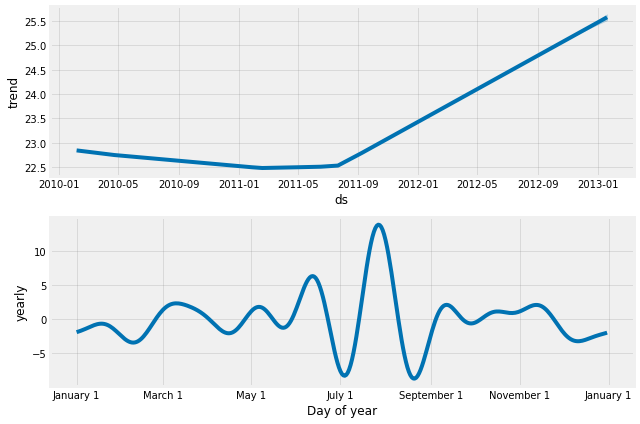

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Department: 46
             ds
6443 2012-12-23
6444 2012-12-30
6445 2013-01-06
6446 2013-01-13
6447 2013-01-20
             ds          yhat   yhat_lower    yhat_upper
6443 2012-12-23  32008.481170  8684.076075  57522.563425
6444 2012-12-30  27274.232155  2722.272884  52144.095653
6445 2013-01-06  20478.733980 -3212.145484  43590.387725
6446 2013-01-13  16102.927033 -8836.690184  39914.016943
6447 2013-01-20  16031.921550 -9383.499205  39425.019017
Forcasting


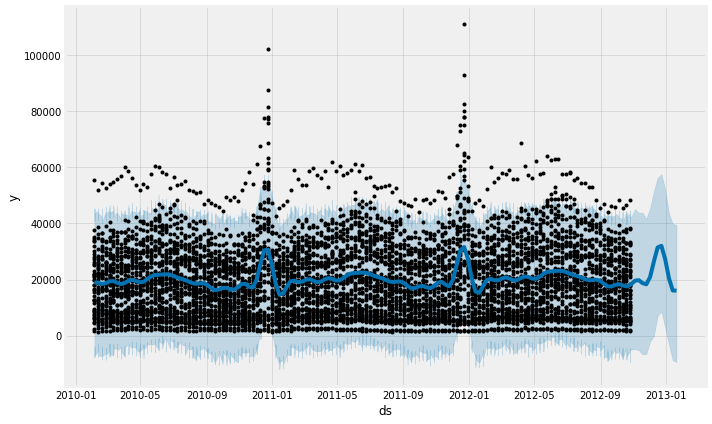

Model Intepretation


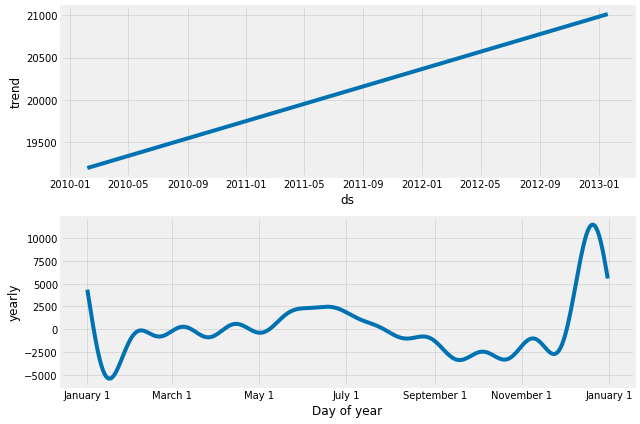

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Department: 47
            ds
654 2012-12-23
655 2012-12-30
656 2013-01-06
657 2013-01-13
658 2013-01-20
            ds       yhat  yhat_lower  yhat_upper
654 2012-12-23  35.156874 -540.587295  584.177812
655 2012-12-30 -26.002685 -609.447424  568.633464
656 2013-01-06 -25.039653 -638.552411  529.202772
657 2013-01-13  14.676879 -568.011418  585.053263
658 2013-01-20  41.894858 -539.275592  661.488537
Forcasting


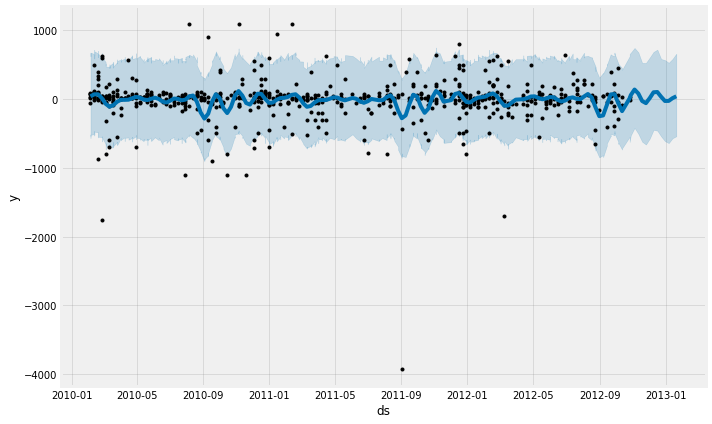

Model Intepretation


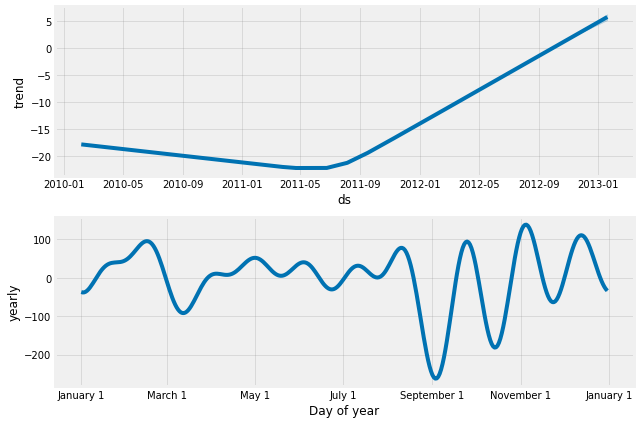

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Department: 48
             ds
1750 2012-12-23
1751 2012-12-30
1752 2013-01-06
1753 2013-01-13
1754 2013-01-20
             ds         yhat   yhat_lower   yhat_upper
1750 2012-12-23  3956.446230  1893.843851  6007.356543
1751 2012-12-30  3472.467100  1353.626429  5760.021230
1752 2013-01-06  2692.319707   484.858579  4714.267928
1753 2013-01-13  2088.352082   -34.045820  4249.527880
1754 2013-01-20  1964.075686  -259.007892  4288.657254
Forcasting


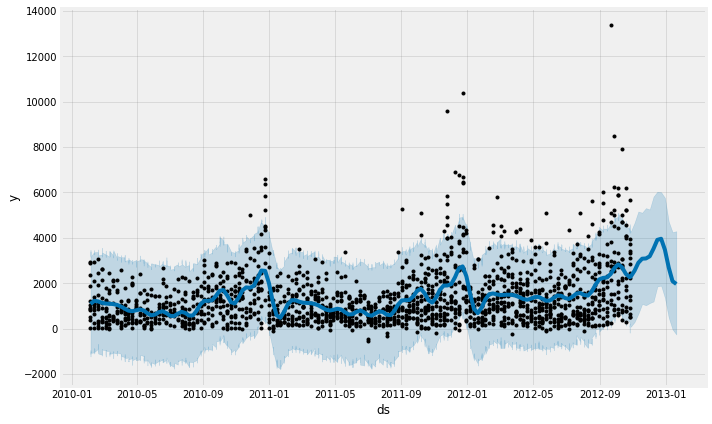

Model Intepretation


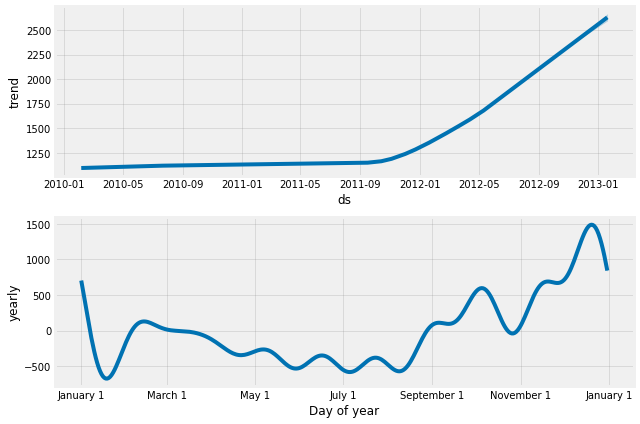

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Department: 49
             ds
4490 2012-12-23
4491 2012-12-30
4492 2013-01-06
4493 2013-01-13
4494 2013-01-20
             ds         yhat   yhat_lower    yhat_upper
4490 2012-12-23  5394.753974 -7355.904203  17276.356103
4491 2012-12-30  5675.295285 -7460.135712  18139.727480
4492 2013-01-06  5973.373431 -6412.257355  19681.291999
4493 2013-01-13  6148.788657 -5614.198584  18868.248212
4494 2013-01-20  6166.910643 -7295.223464  20709.276065
Forcasting


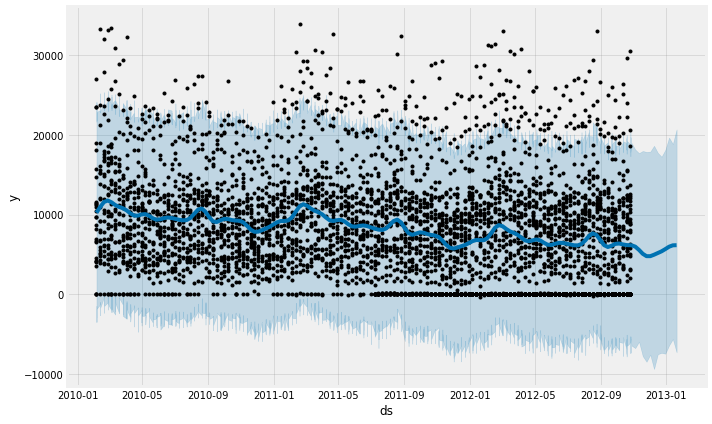

Model Intepretation


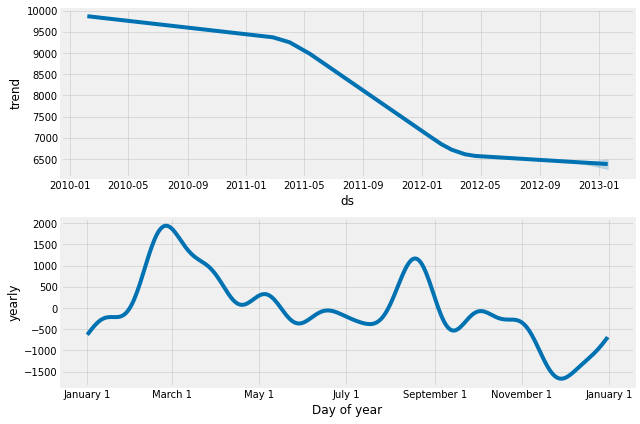

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Department: 51
             ds
1402 2012-12-09
1403 2012-12-16
1404 2012-12-23
1405 2012-12-30
1406 2013-01-06
             ds       yhat  yhat_lower  yhat_upper
1402 2012-12-09   9.689303  -45.631557   63.324916
1403 2012-12-16  13.712665  -38.900282   71.044203
1404 2012-12-23  12.686058  -39.889610   67.350623
1405 2012-12-30   7.958957  -46.872859   61.816815
1406 2013-01-06   2.327934  -50.515666   58.671387
Forcasting


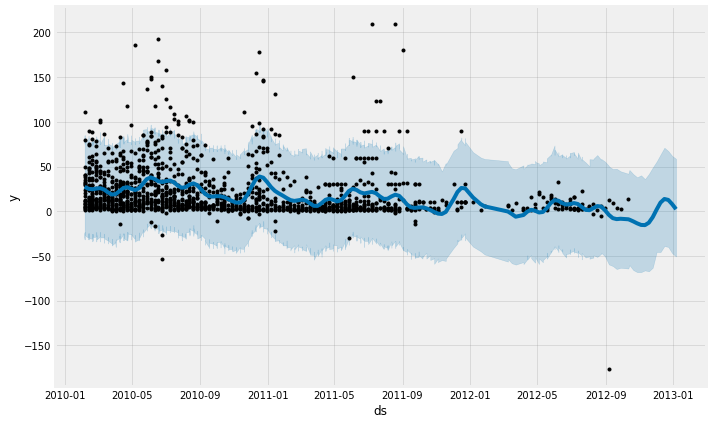

Model Intepretation


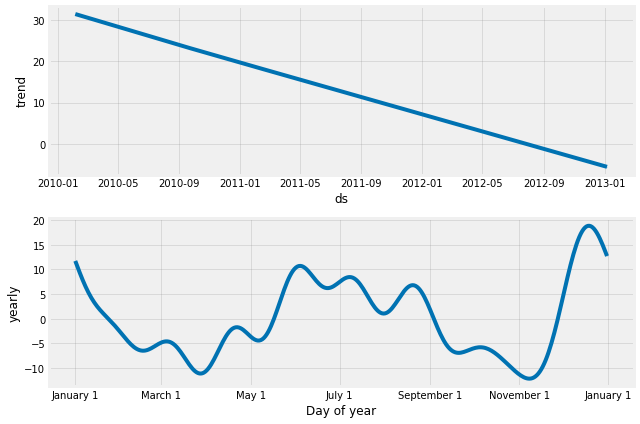

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Department: 52
             ds
6276 2012-12-23
6277 2012-12-30
6278 2013-01-06
6279 2013-01-13
6280 2013-01-20
             ds         yhat   yhat_lower   yhat_upper
6276 2012-12-23  2079.691255  -563.987502  4816.893388
6277 2012-12-30  1687.465029 -1139.102900  4695.585427
6278 2013-01-06  1368.222781 -1425.373683  4017.940339
6279 2013-01-13  1209.779120 -1305.679510  3953.594547
6280 2013-01-20  1229.741406 -1621.105884  3962.684523
Forcasting


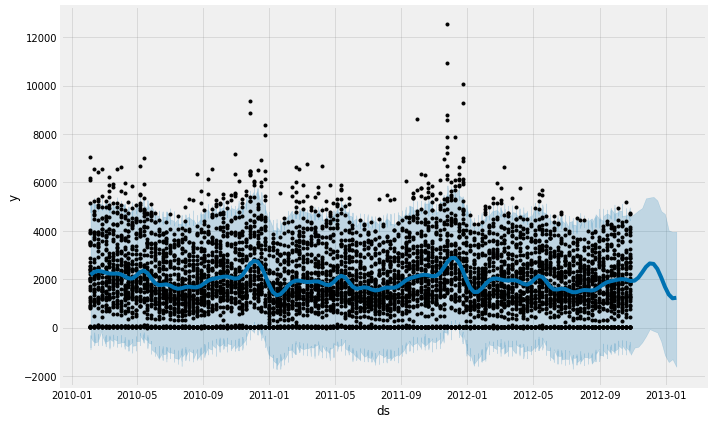

Model Intepretation


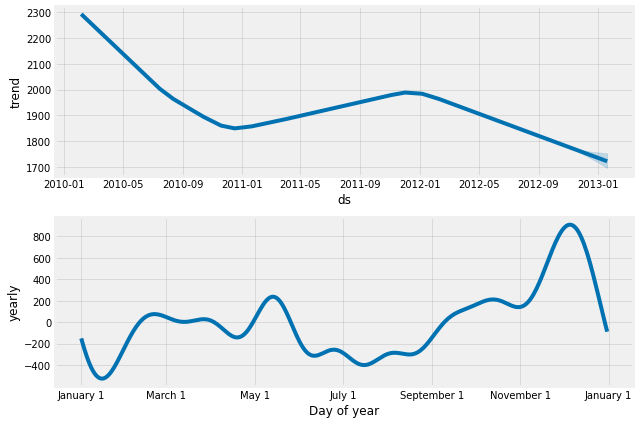

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Department: 54
             ds
4775 2012-12-23
4776 2012-12-30
4777 2013-01-06
4778 2013-01-13
4779 2013-01-20
             ds        yhat  yhat_lower  yhat_upper
4775 2012-12-23  124.950782 -110.034616  341.942419
4776 2012-12-30   91.318239 -152.517084  332.261422
4777 2013-01-06   34.780576 -184.978111  275.422724
4778 2013-01-13   -9.872818 -258.534718  221.486377
4779 2013-01-20  -21.108240 -252.838086  231.262083
Forcasting


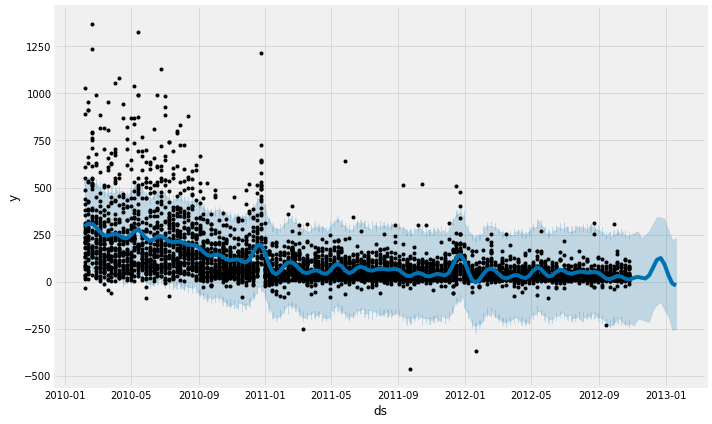

Model Intepretation


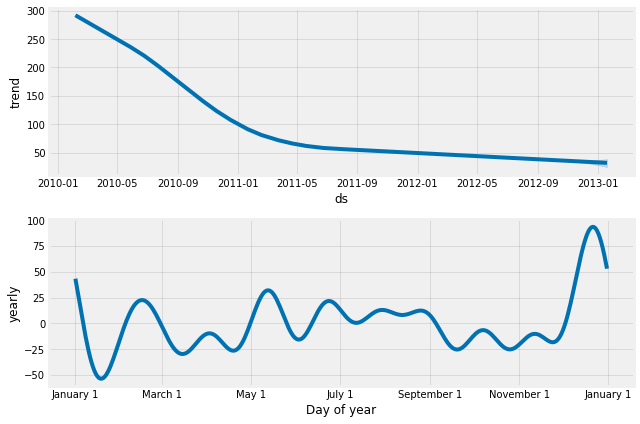

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Department: 55
             ds
5604 2012-12-23
5605 2012-12-30
5606 2013-01-06
5607 2013-01-13
5608 2013-01-20
             ds          yhat    yhat_lower    yhat_upper
5604 2012-12-23  31846.974079  17527.260231  45724.668500
5605 2012-12-30  25630.364206  11593.474584  38249.026497
5606 2013-01-06  14532.360002   2309.744585  27915.833490
5607 2013-01-13   5525.267295  -8149.705962  19183.331716
5608 2013-01-20   3481.240373 -10246.758439  16820.114149
Forcasting


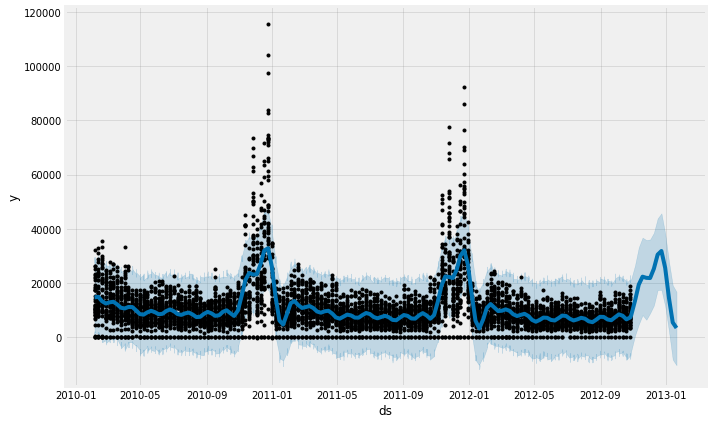

Model Intepretation


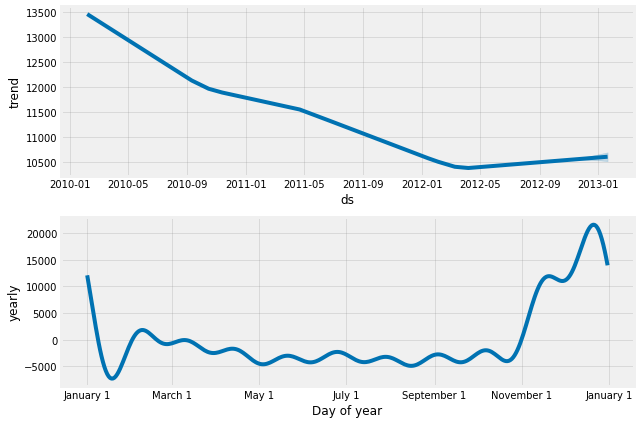

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Department: 56
             ds
5880 2012-12-23
5881 2012-12-30
5882 2013-01-06
5883 2013-01-13
5884 2013-01-20
             ds        yhat   yhat_lower    yhat_upper
5880 2012-12-23  958.208708 -8153.569002  10078.299072
5881 2012-12-30  343.656672 -8979.944166   9432.162464
5882 2013-01-06  121.179856 -9786.203940   9060.301929
5883 2013-01-13  231.172083 -8655.041675   9262.453897
5884 2013-01-20  452.028773 -8225.751318   9453.901021
Forcasting


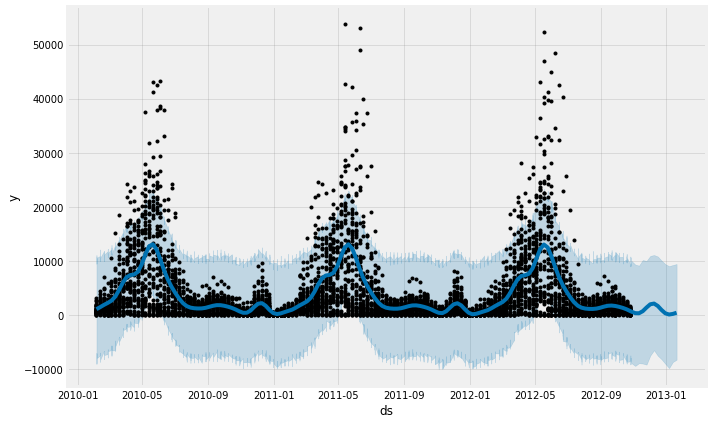

Model Intepretation


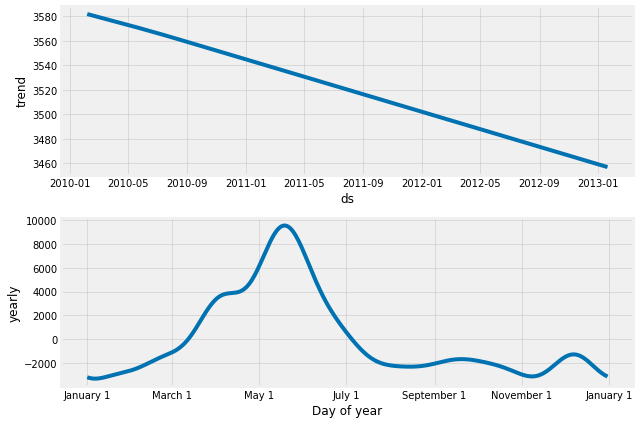

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Department: 58
             ds
4398 2012-12-23
4399 2012-12-30
4400 2013-01-06
4401 2013-01-13
4402 2013-01-20
             ds         yhat   yhat_lower    yhat_upper
4398 2012-12-23  5018.564035 -3295.211299  13083.440590
4399 2012-12-30  4638.649729 -4577.952596  13332.970912
4400 2013-01-06  4026.875278 -4738.007720  12676.385099
4401 2013-01-13  3577.405264 -5019.773144  11492.945902
4402 2013-01-20  3565.564750 -4720.077113  11340.393617
Forcasting


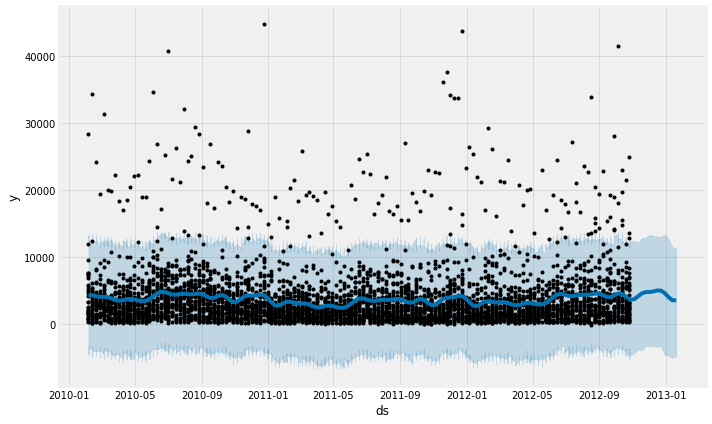

Model Intepretation


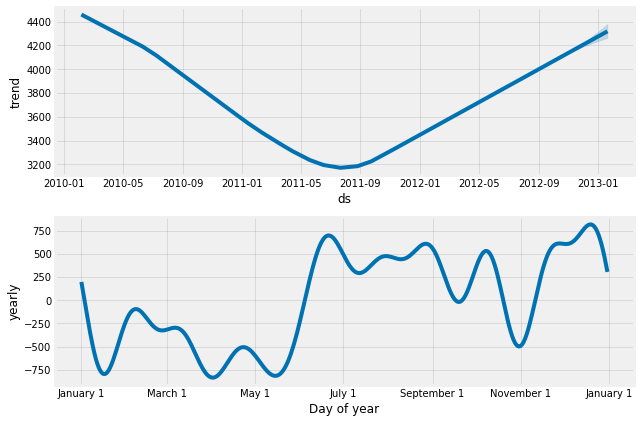

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Department: 59
             ds
6114 2012-12-23
6115 2012-12-30
6116 2013-01-06
6117 2013-01-13
6118 2013-01-20
             ds         yhat   yhat_lower   yhat_upper
6114 2012-12-23  6330.039681  3023.846292  9437.787512
6115 2012-12-30  4760.505865  1597.935700  7626.620027
6116 2013-01-06  2141.715469 -1000.810339  5394.191086
6117 2013-01-13   166.219768 -3126.050444  3465.834820
6118 2013-01-20  -290.433881 -3369.291256  2914.014759
Forcasting


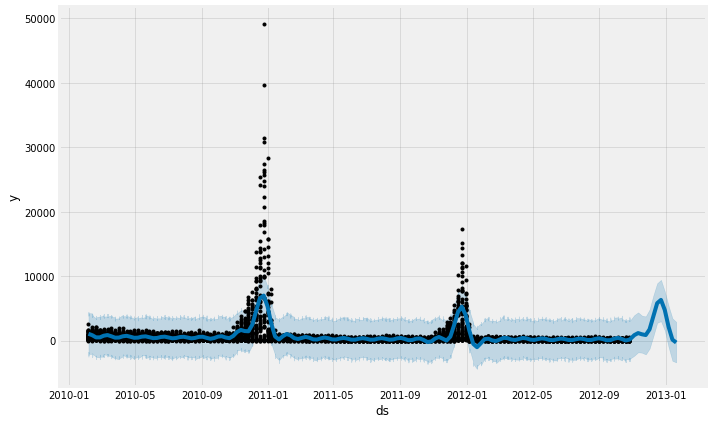

Model Intepretation


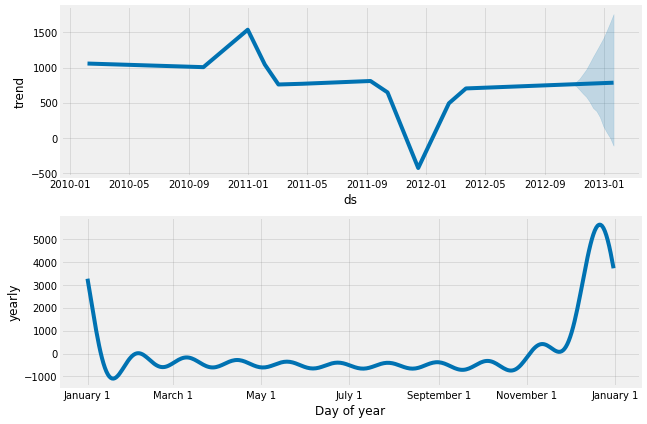

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Department: 60
             ds
5780 2012-12-23
5781 2012-12-30
5782 2013-01-06
5783 2013-01-13
5784 2013-01-20
             ds        yhat  yhat_lower   yhat_upper
5780 2012-12-23  567.704710   21.271425  1093.509671
5781 2012-12-30  388.809411 -184.221038   898.131739
5782 2013-01-06  269.962710 -280.594397   768.725990
5783 2013-01-13  267.008334 -270.356110   802.234344
5784 2013-01-20  330.013187 -210.510666   856.330833
Forcasting


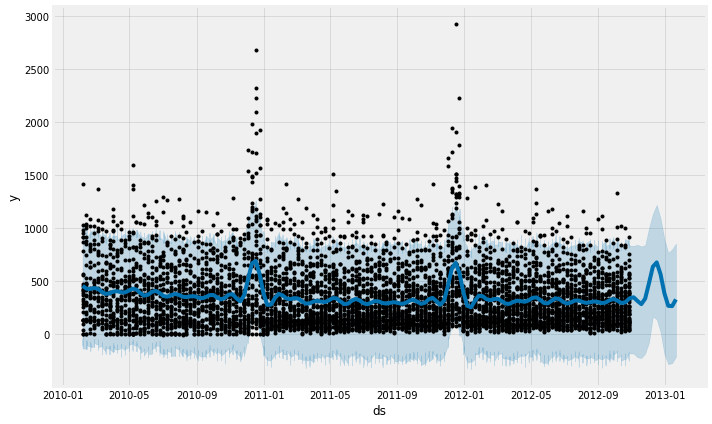

Model Intepretation


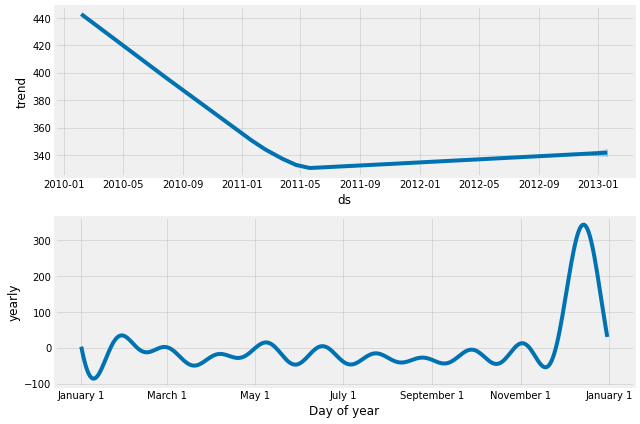

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Department: 67
             ds
6443 2012-12-23
6444 2012-12-30
6445 2013-01-06
6446 2013-01-13
6447 2013-01-20
             ds          yhat   yhat_lower    yhat_upper
6443 2012-12-23  13675.846759  3783.198633  24110.450092
6444 2012-12-30  10419.271138  -368.325027  20411.941668
6445 2013-01-06   6217.363113 -3382.819936  15879.842931
6446 2013-01-13   3642.891878 -6996.148298  13397.231446
6447 2013-01-20   3972.947947 -6710.584281  14641.719668
Forcasting


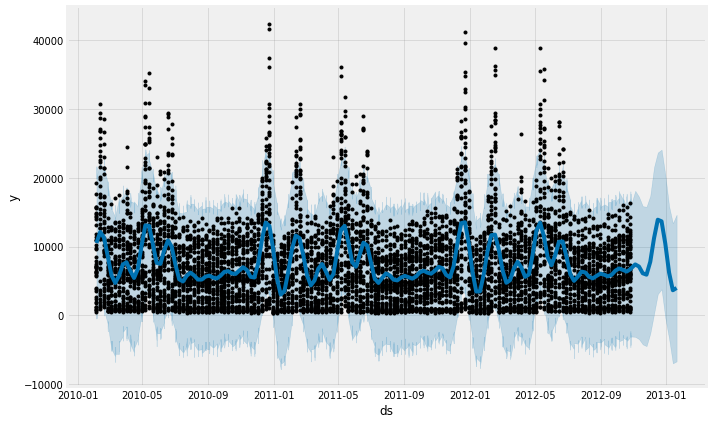

Model Intepretation


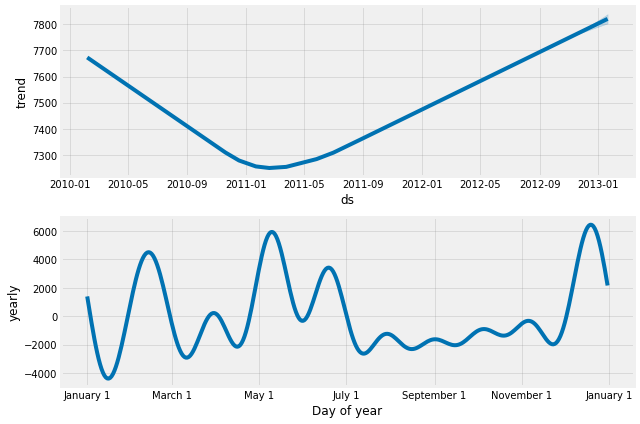

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Department: 71
             ds
5317 2012-12-23
5318 2012-12-30
5319 2013-01-06
5320 2013-01-13
5321 2013-01-20
             ds         yhat   yhat_lower    yhat_upper
5317 2012-12-23  6796.138062  -925.284198  14225.826481
5318 2012-12-30  6689.220598  -568.091238  14102.281660
5319 2013-01-06  5731.494452 -1599.356160  12754.183695
5320 2013-01-13  4607.701183 -2651.683737  11960.660467
5321 2013-01-20  4359.202189 -3082.140489  11449.185818
Forcasting


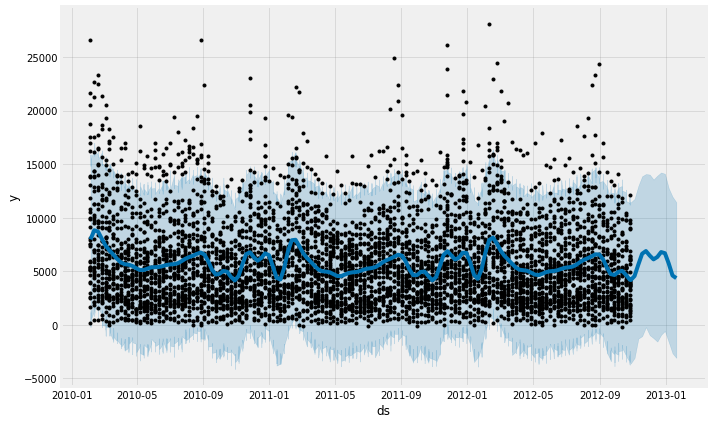

Model Intepretation


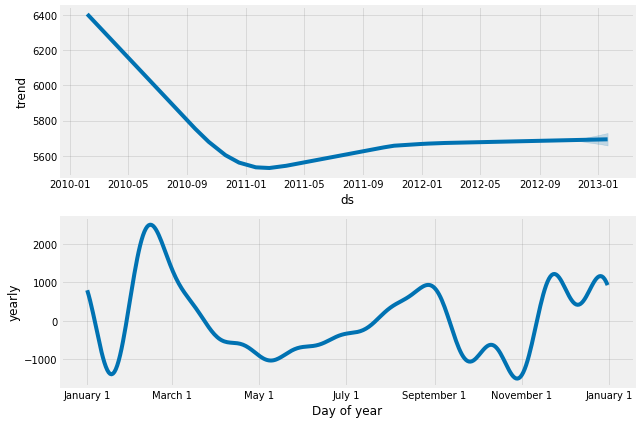

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Department: 72
             ds
6054 2012-12-23
6055 2012-12-30
6056 2013-01-06
6057 2013-01-13
6058 2013-01-20
             ds          yhat    yhat_lower     yhat_upper
6054 2012-12-23  82958.637423    270.126354  164651.740987
6055 2012-12-30  77837.606791   -264.984742  159325.164845
6056 2013-01-06  60273.746264 -14711.868136  139415.548383
6057 2013-01-13  39720.350168 -37613.854109  120669.090447
6058 2013-01-20  33424.942869 -44388.332741  112235.932442
Forcasting


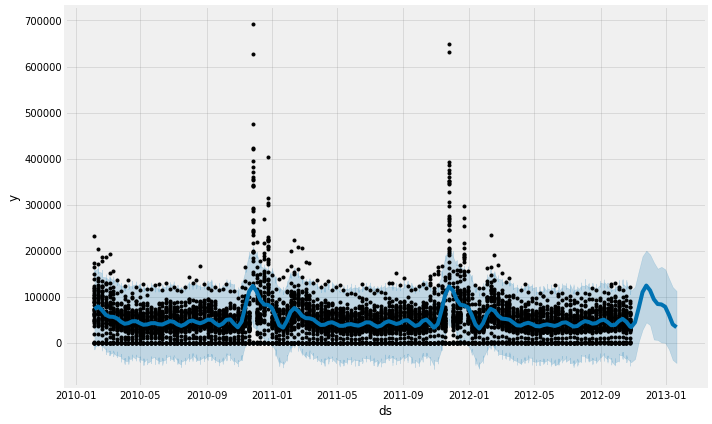

Model Intepretation


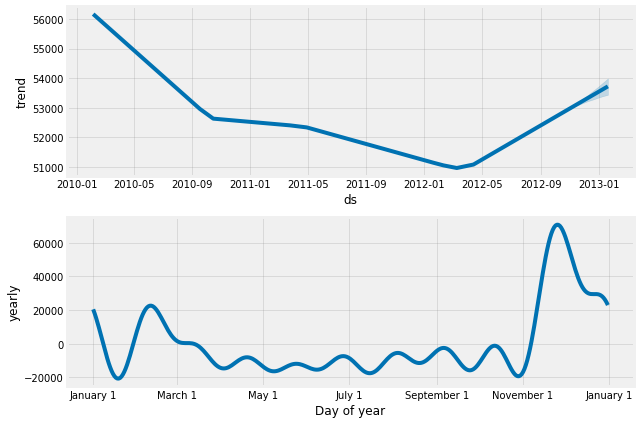

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Department: 74
             ds
6438 2012-12-23
6439 2012-12-30
6440 2013-01-06
6441 2013-01-13
6442 2013-01-20
             ds          yhat   yhat_lower    yhat_upper
6438 2012-12-23  14135.201835 -4658.082578  34160.157357
6439 2012-12-30  16031.446161 -5495.565751  35954.694301
6440 2013-01-06  16175.017397 -3062.104153  36337.704096
6441 2013-01-13  14473.126595 -6104.452307  34688.570211
6442 2013-01-20  12485.957107 -6674.065531  30317.882077
Forcasting


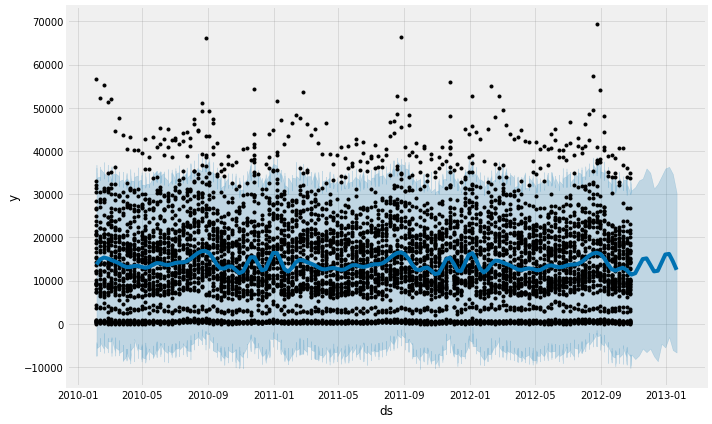

Model Intepretation


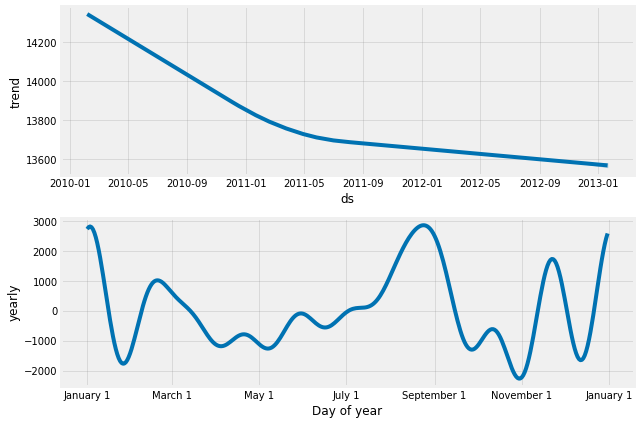

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Department: 77
            ds
158 2012-12-23
159 2012-12-30
160 2013-01-06
161 2013-01-13
162 2013-01-20
            ds        yhat  yhat_lower  yhat_upper
158 2012-12-23  356.731071 -102.666538  823.336091
159 2012-12-30  327.004756 -136.235464  832.678062
160 2013-01-06  175.441117 -279.887623  619.147014
161 2013-01-13   68.912369 -356.816218  543.879029
162 2013-01-20  100.422771 -364.349798  559.480529
Forcasting


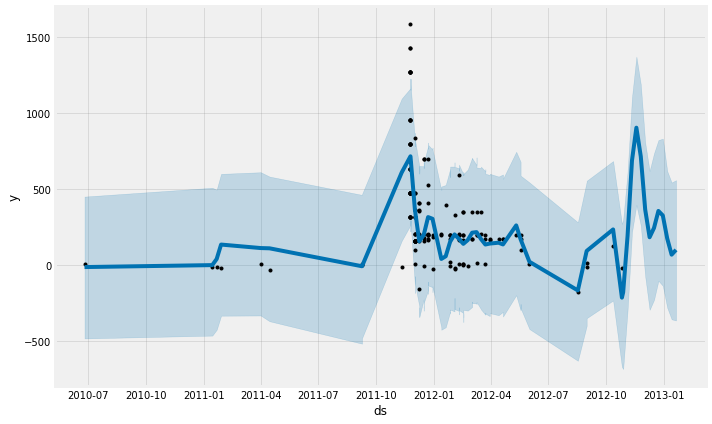

Model Intepretation


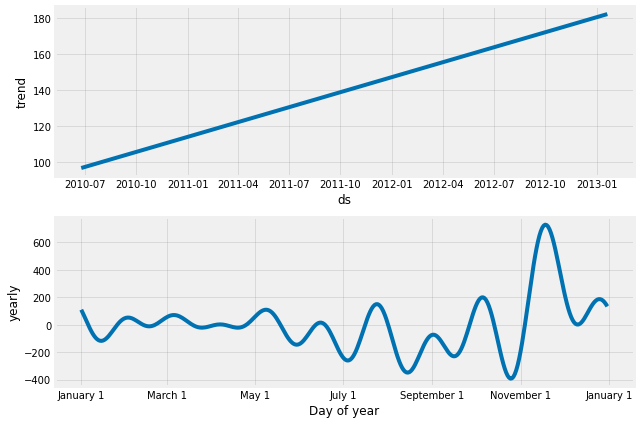

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Department: 78
            ds
243 2012-11-04
244 2012-11-11
245 2012-11-18
246 2012-11-25
247 2012-12-02
            ds      yhat  yhat_lower  yhat_upper
243 2012-11-04  0.615016  -20.136501   18.365168
244 2012-11-11  4.470545  -14.066236   21.463326
245 2012-11-18  3.897265  -14.786465   21.903014
246 2012-11-25  0.959531  -16.348757   18.593451
247 2012-12-02  0.097579  -18.354189   19.379665
Forcasting


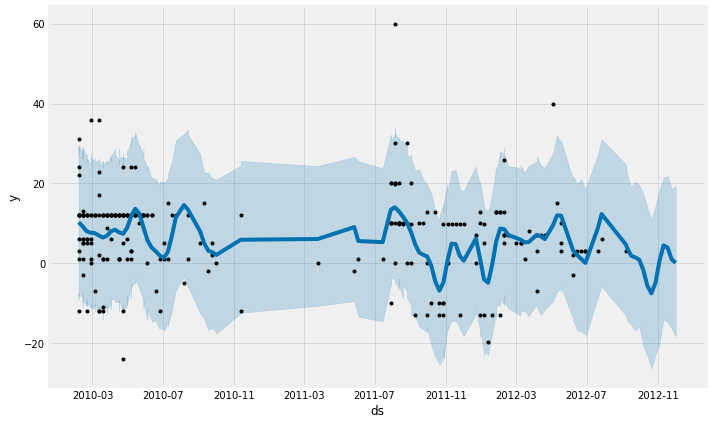

Model Intepretation


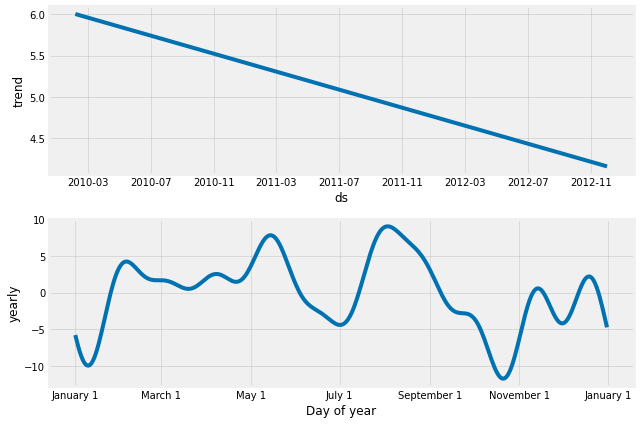

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Department: 79
             ds
6443 2012-12-23
6444 2012-12-30
6445 2013-01-06
6446 2013-01-13
6447 2013-01-20
             ds          yhat   yhat_lower    yhat_upper
6443 2012-12-23  22635.415845 -5869.974417  49756.575958
6444 2012-12-30  21495.398049 -3811.606342  47603.737732
6445 2013-01-06  20194.320503 -7025.810272  45683.408914
6446 2013-01-13  19783.722384 -6732.102286  47114.657315
6447 2013-01-20  20635.554063 -3437.144919  47486.100412
Forcasting


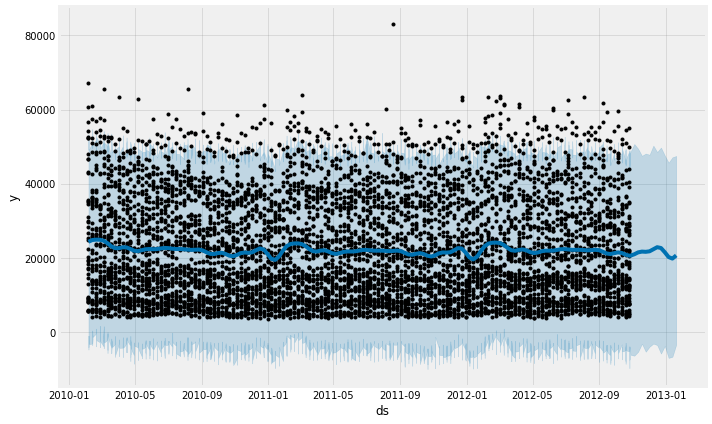

Model Intepretation


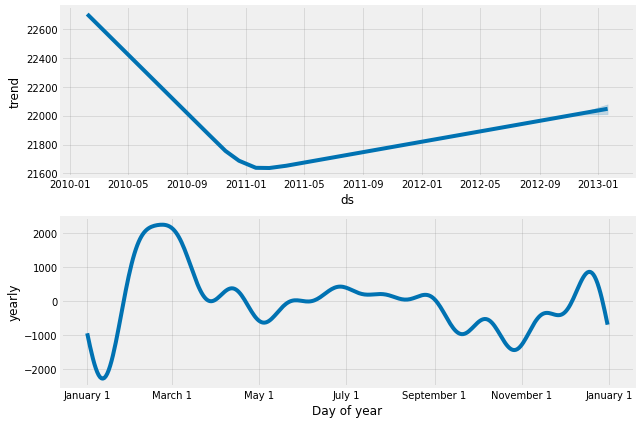

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Department: 80
             ds
5899 2012-12-23
5900 2012-12-30
5901 2013-01-06
5902 2013-01-13
5903 2013-01-20
             ds          yhat    yhat_lower    yhat_upper
5899 2012-12-23  12284.126768  -8346.525330  34151.502936
5900 2012-12-30  11790.014798  -8132.566119  32936.710080
5901 2013-01-06  11218.024382 -10100.453178  29988.584390
5902 2013-01-13  11097.207164  -8685.051237  31535.437337
5903 2013-01-20  11498.616690  -7921.943612  32833.462603
Forcasting


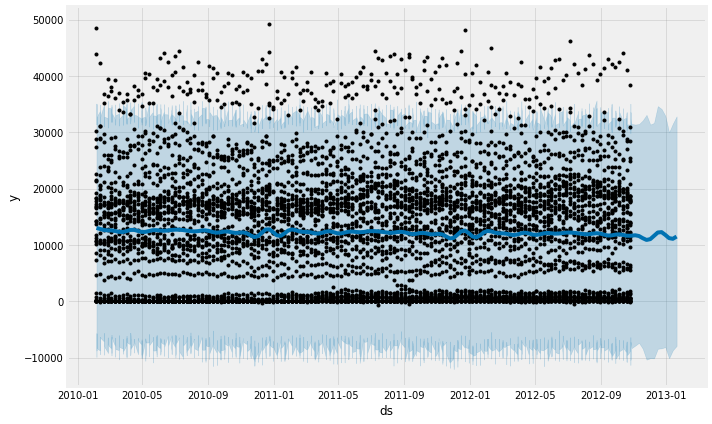

Model Intepretation


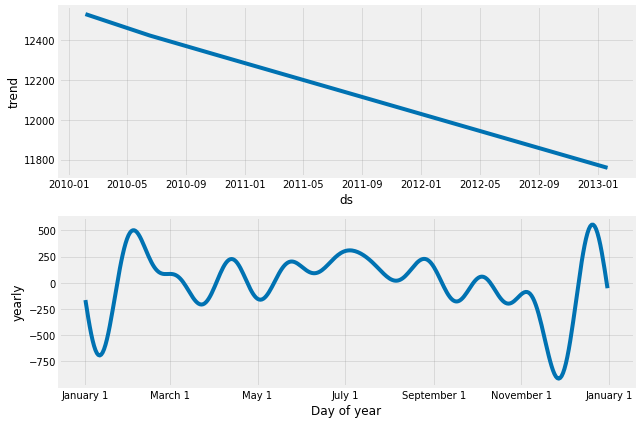

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Department: 81
             ds
6443 2012-12-23
6444 2012-12-30
6445 2013-01-06
6446 2013-01-13
6447 2013-01-20
             ds          yhat   yhat_lower    yhat_upper
6443 2012-12-23  14656.062481 -3830.651187  33617.467410
6444 2012-12-30  14401.952039 -6015.803299  33672.089464
6445 2013-01-06  14509.568519 -4060.221756  31857.830388
6446 2013-01-13  15054.358943 -4148.374581  32877.665870
6447 2013-01-20  15770.383982 -2276.947948  34112.975175
Forcasting


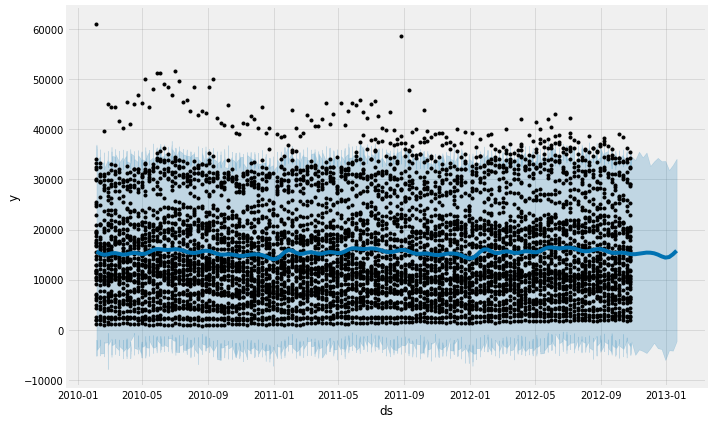

Model Intepretation


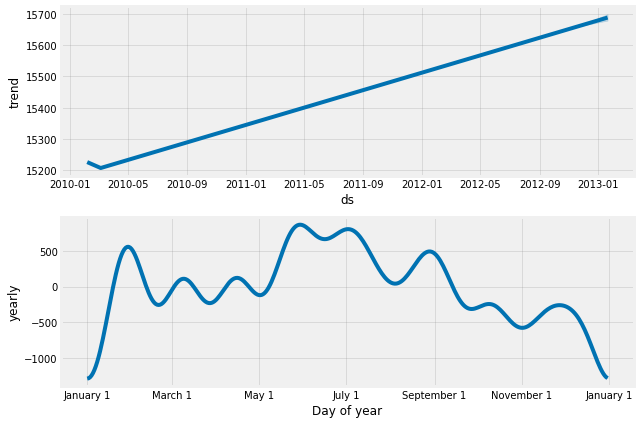

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Department: 82
             ds
6443 2012-12-23
6444 2012-12-30
6445 2013-01-06
6446 2013-01-13
6447 2013-01-20
             ds          yhat    yhat_lower    yhat_upper
6443 2012-12-23  40359.717629  21338.631684  58729.020410
6444 2012-12-30  31477.784722  12633.020662  48777.362026
6445 2013-01-06  18995.629829    761.025710  36579.211463
6446 2013-01-13  10998.289789  -6595.298786  28623.690344
6447 2013-01-20  10631.754907  -8625.945307  27567.746601
Forcasting


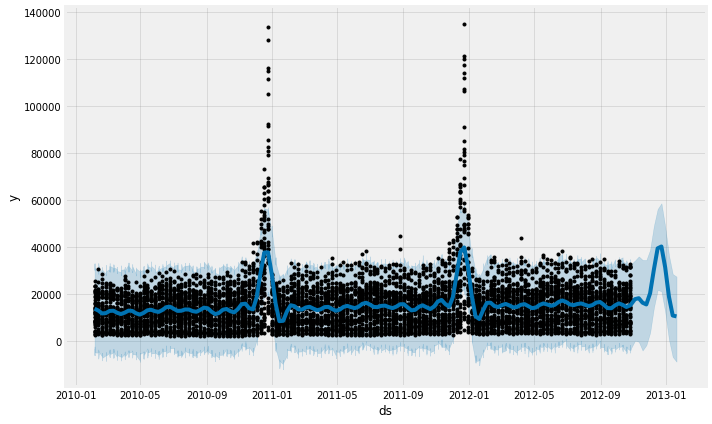

Model Intepretation


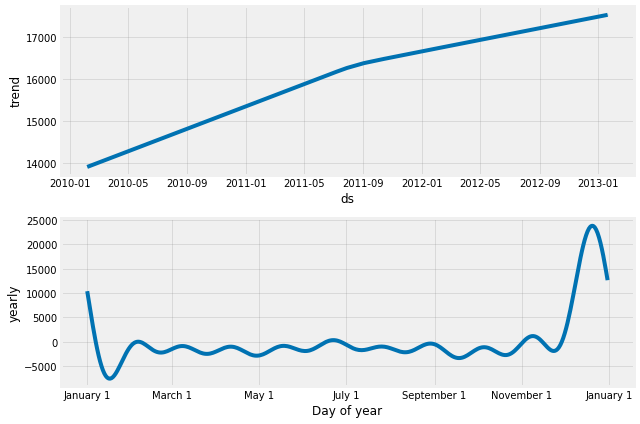

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Department: 83
             ds
5916 2012-12-23
5917 2012-12-30
5918 2013-01-06
5919 2013-01-13
5920 2013-01-20
             ds         yhat   yhat_lower   yhat_upper
5916 2012-12-23  3905.411418 -1700.399295  9552.930222
5917 2012-12-30  3981.352176 -1076.757181  9663.614954
5918 2013-01-06  3793.870170 -1505.298543  9582.617372
5919 2013-01-13  3533.879463 -1615.625459  9396.583265
5920 2013-01-20  3388.092401 -2198.277935  8980.072516
Forcasting


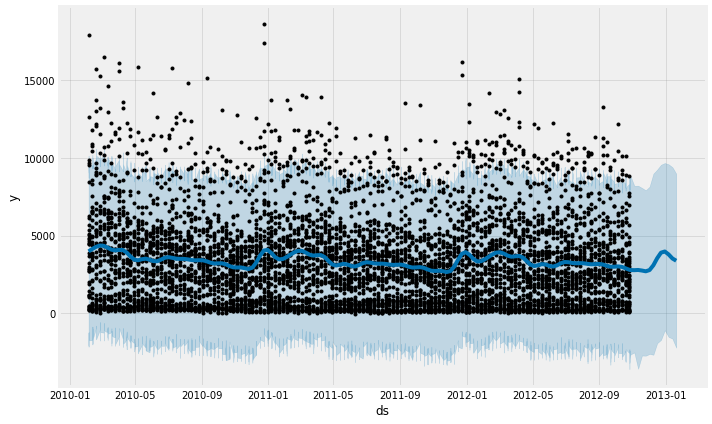

Model Intepretation


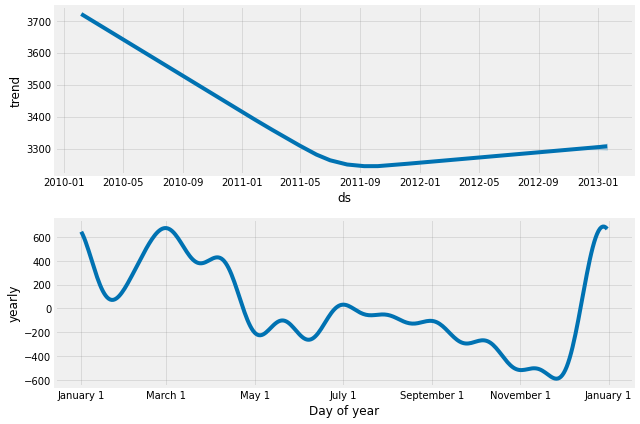

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Department: 85
             ds
6063 2012-12-23
6064 2012-12-30
6065 2013-01-06
6066 2013-01-13
6067 2013-01-20
             ds         yhat   yhat_lower   yhat_upper
6063 2012-12-23  4885.560788  1712.380071  7858.706307
6064 2012-12-30  3341.314518    74.668381  6414.242396
6065 2013-01-06  1764.806527 -1356.678111  4779.883093
6066 2013-01-13  1056.374035 -1861.469953  4218.697389
6067 2013-01-20  1206.762371 -1710.124646  4251.207852
Forcasting


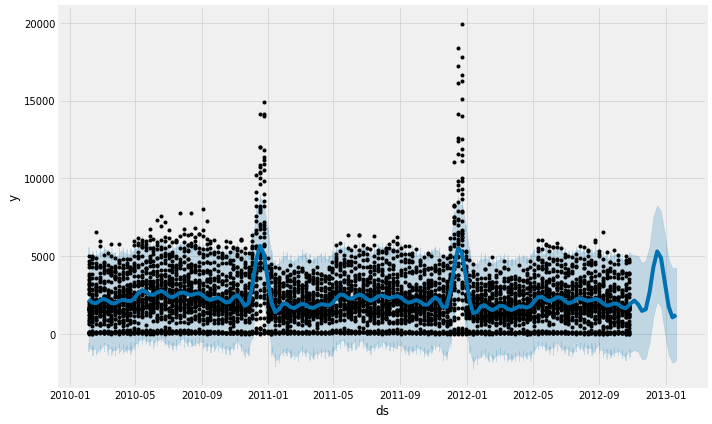

Model Intepretation


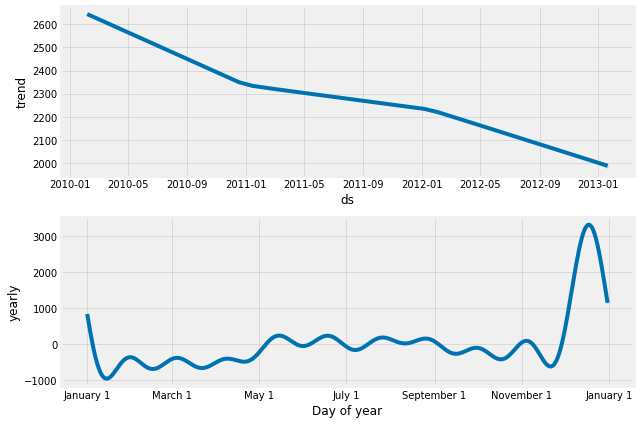

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Department: 87
             ds
6399 2012-12-23
6400 2012-12-30
6401 2013-01-06
6402 2013-01-13
6403 2013-01-20
             ds          yhat   yhat_lower    yhat_upper
6399 2012-12-23  18935.618332 -3542.610579  40216.055659
6400 2012-12-30  17677.366630 -5937.057535  40133.678062
6401 2013-01-06  15582.564123 -6426.349965  40078.178078
6402 2013-01-13  14296.196361 -6787.905347  36849.975591
6403 2013-01-20  14737.824025 -6997.288750  37230.708002
Forcasting


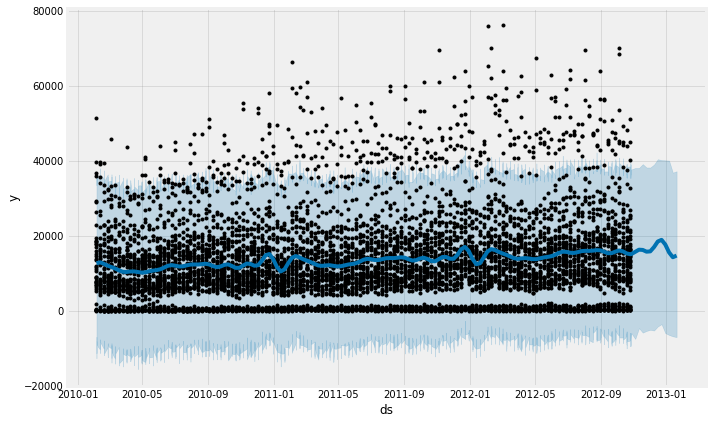

Model Intepretation


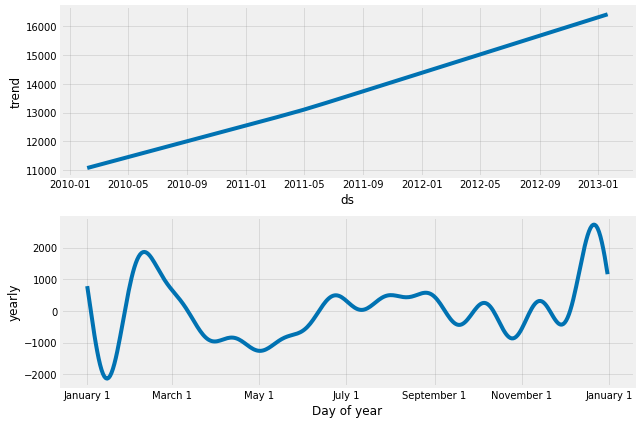

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Department: 90
             ds
6443 2012-12-23
6444 2012-12-30
6445 2013-01-06
6446 2013-01-13
6447 2013-01-20
             ds          yhat    yhat_lower     yhat_upper
6443 2012-12-23  53329.700862 -11494.820360  116042.427403
6444 2012-12-30  51369.524399 -14754.717220  111949.057763
6445 2013-01-06  48350.600829 -16414.651725  117516.825953
6446 2013-01-13  46756.050001 -19418.566567  106795.722514
6447 2013-01-20  47622.812274 -11327.537528  115248.984111
Forcasting


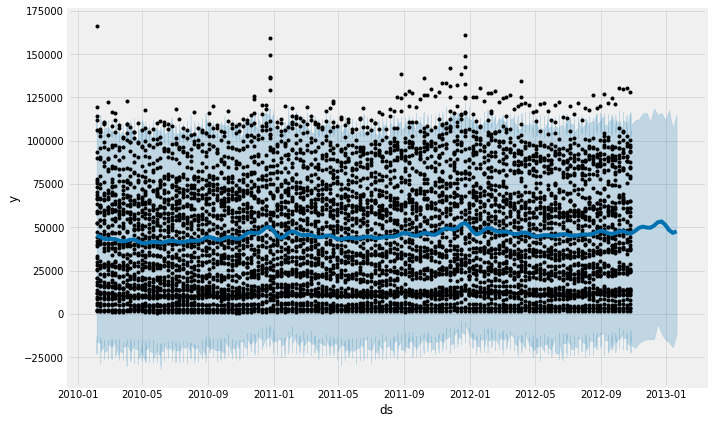

Model Intepretation


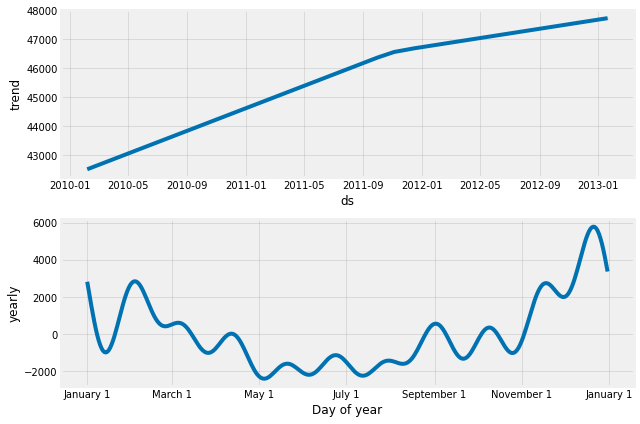

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Department: 91
             ds
6443 2012-12-23
6444 2012-12-30
6445 2013-01-06
6446 2013-01-13
6447 2013-01-20
             ds          yhat    yhat_lower    yhat_upper
6443 2012-12-23  33381.881686 -17745.756182  82725.560806
6444 2012-12-30  33249.954128 -18848.712832  83757.137513
6445 2013-01-06  33643.593047 -21048.389416  83958.094109
6446 2013-01-13  34802.281461 -13808.408226  82891.857442
6447 2013-01-20  36233.186437 -15091.442897  90725.983658
Forcasting


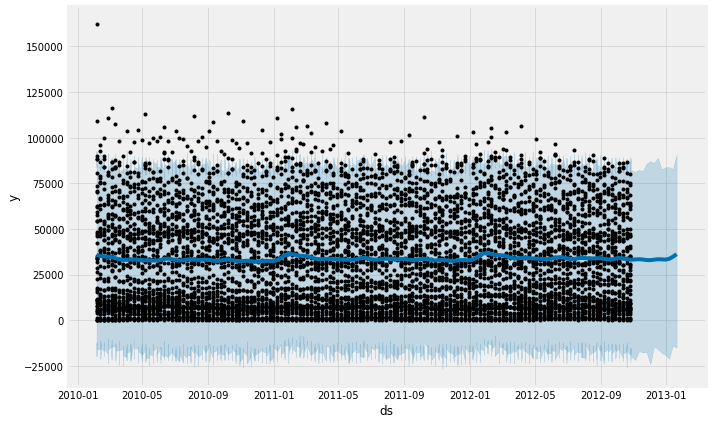

Model Intepretation


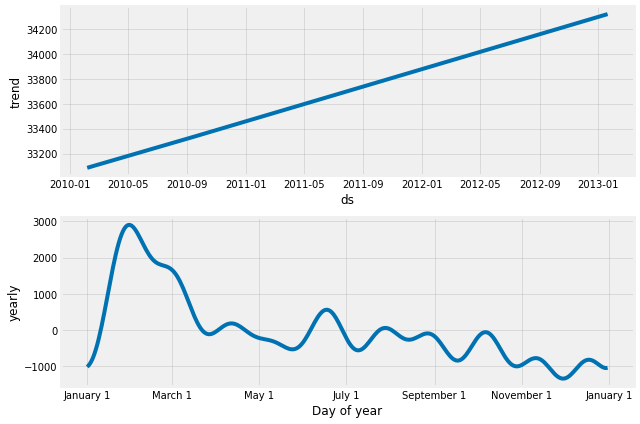

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Department: 92
             ds
6443 2012-12-23
6444 2012-12-30
6445 2013-01-06
6446 2013-01-13
6447 2013-01-20
             ds          yhat    yhat_lower     yhat_upper
6443 2012-12-23  93385.930512   1785.691689  193697.079100
6444 2012-12-30  88986.088231  -1715.892951  186160.879248
6445 2013-01-06  83646.660008 -12122.077231  179763.905175
6446 2013-01-13  81573.968262 -15628.376797  182392.492725
6447 2013-01-20  83890.122265  -8609.628478  178688.166922
Forcasting


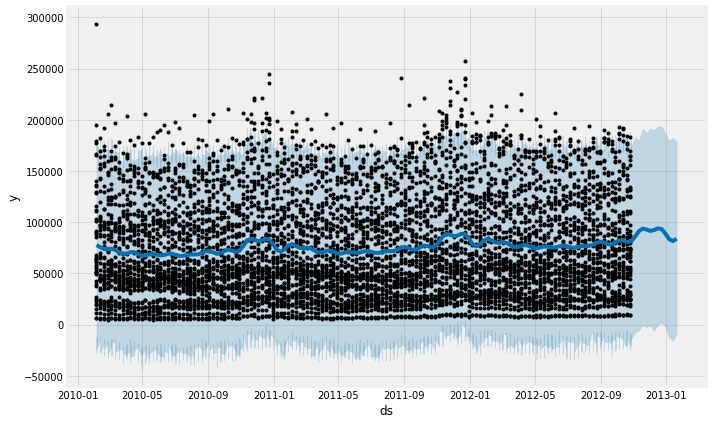

Model Intepretation


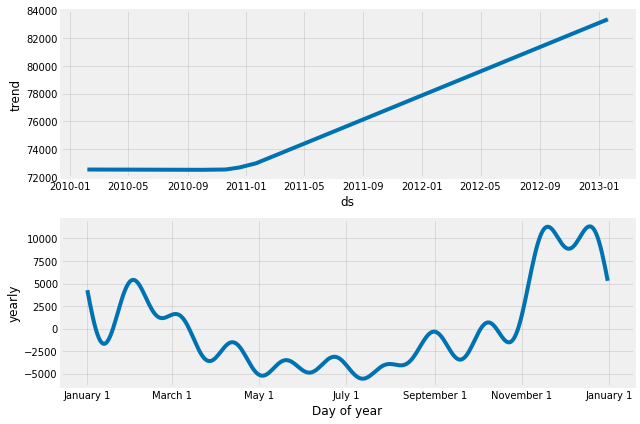

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Department: 93
             ds
5921 2012-12-23
5922 2012-12-30
5923 2013-01-06
5924 2013-01-13
5925 2013-01-20
             ds          yhat    yhat_lower    yhat_upper
5921 2012-12-23  29997.396137 -14439.836831  75771.249314
5922 2012-12-30  29736.751572  -8591.049314  72532.752809
5923 2013-01-06  27960.098225 -15215.093571  70070.447403
5924 2013-01-13  26382.523089 -15568.655450  71136.704242
5925 2013-01-20  26469.345752 -17380.251018  73200.723512
Forcasting


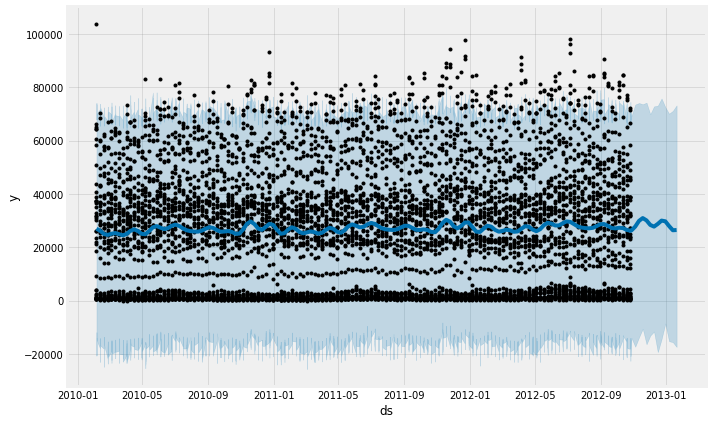

Model Intepretation


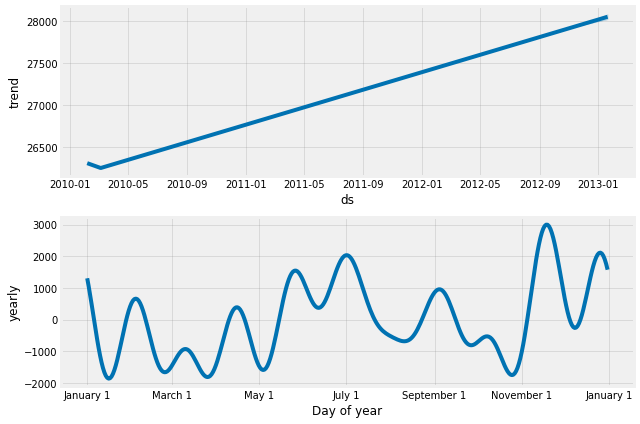

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Department: 94
             ds
5693 2012-12-23
5694 2012-12-30
5695 2013-01-06
5696 2013-01-13
5697 2013-01-20
             ds          yhat    yhat_lower    yhat_upper
5693 2012-12-23  27324.664940 -20612.911276  75762.791176
5694 2012-12-30  27848.421126 -19429.849850  74565.029675
5695 2013-01-06  28172.884680 -21768.490134  78457.883476
5696 2013-01-13  28823.394777 -20265.939081  78712.374658
5697 2013-01-20  29846.994816 -17946.384328  82268.388082
Forcasting


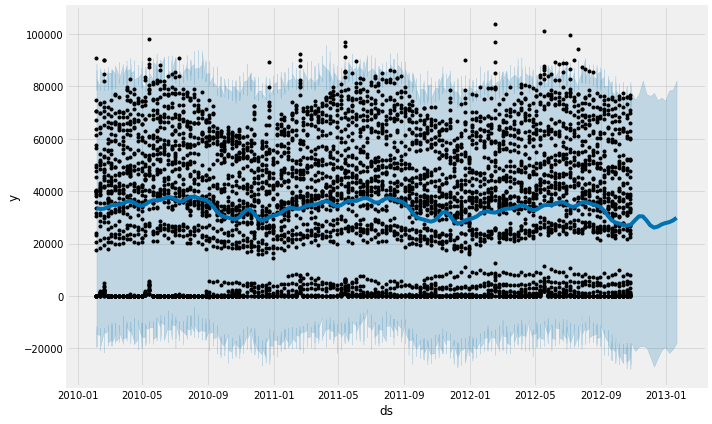

Model Intepretation


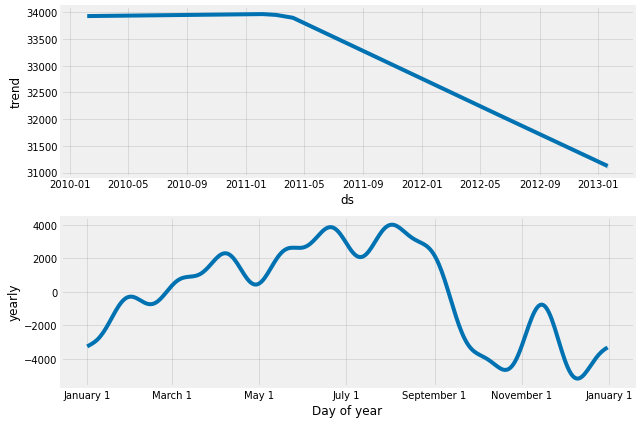

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Department: 95
             ds
6443 2012-12-23
6444 2012-12-30
6445 2013-01-06
6446 2013-01-13
6447 2013-01-20
             ds          yhat    yhat_lower     yhat_upper
6443 2012-12-23  68245.577318  -5363.281155  139367.788950
6444 2012-12-30  66069.977425  -9117.312474  140367.404608
6445 2013-01-06  63327.795971  -9786.994569  137195.003977
6446 2013-01-13  62703.968349 -11886.987236  131300.089789
6447 2013-01-20  64950.571533 -10884.128428  137465.315210
Forcasting


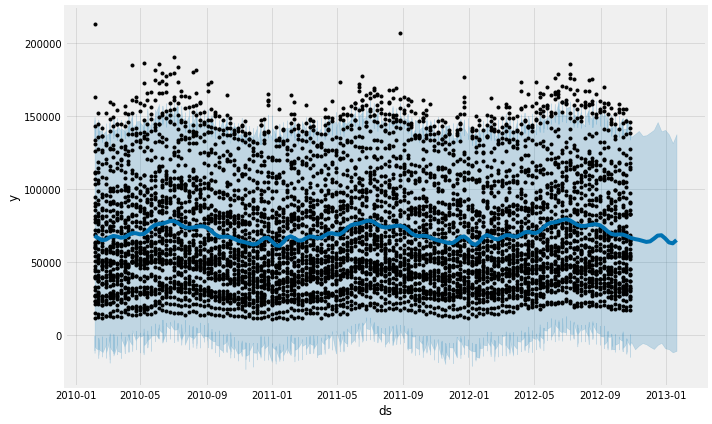

Model Intepretation


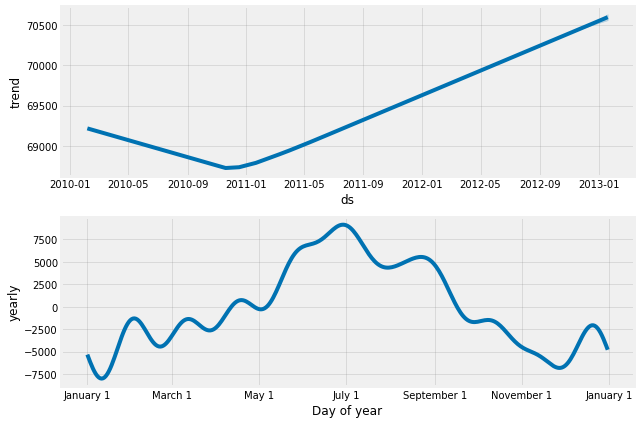

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Department: 96
             ds
4862 2012-12-23
4863 2012-12-30
4864 2013-01-06
4865 2013-01-13
4866 2013-01-20
             ds          yhat    yhat_lower    yhat_upper
4862 2012-12-23  16785.280013  -3424.016919  39632.394177
4863 2012-12-30  16912.674975  -5715.628128  38507.494923
4864 2013-01-06  14768.922773  -5893.647271  34912.343831
4865 2013-01-13  12037.698049  -9215.807247  31929.492737
4866 2013-01-20  11015.171439 -10014.017903  32617.301631
Forcasting


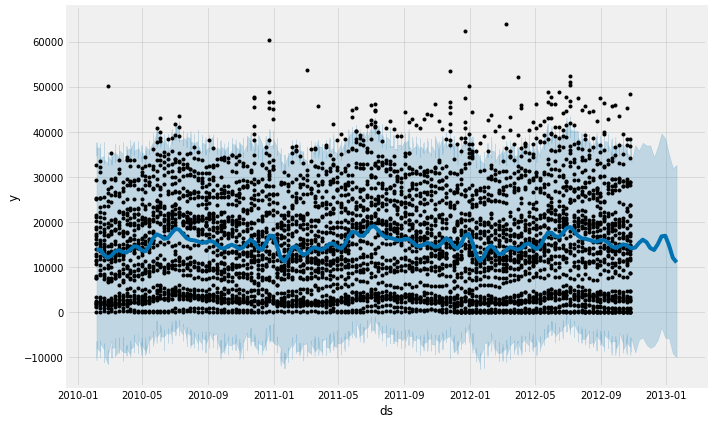

Model Intepretation


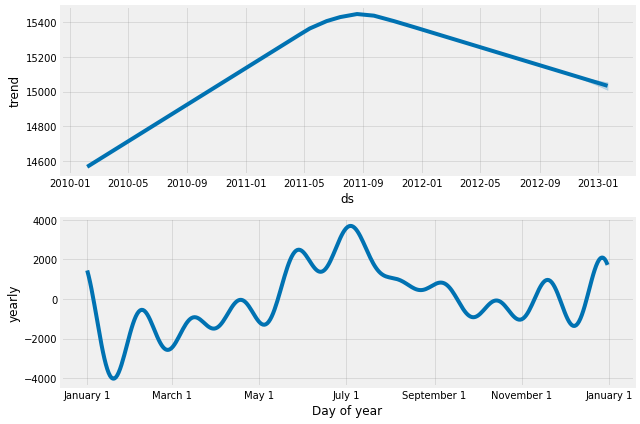

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Department: 97
             ds
6286 2012-12-23
6287 2012-12-30
6288 2013-01-06
6289 2013-01-13
6290 2013-01-20
             ds          yhat   yhat_lower    yhat_upper
6286 2012-12-23  14920.511343 -6820.287338  36381.909582
6287 2012-12-30  14627.959516 -7798.779419  36879.648822
6288 2013-01-06  13991.287400 -6730.475913  35755.156234
6289 2013-01-13  13649.869904 -6468.535485  36379.542986
6290 2013-01-20  13897.777384 -7422.274820  36439.687124
Forcasting


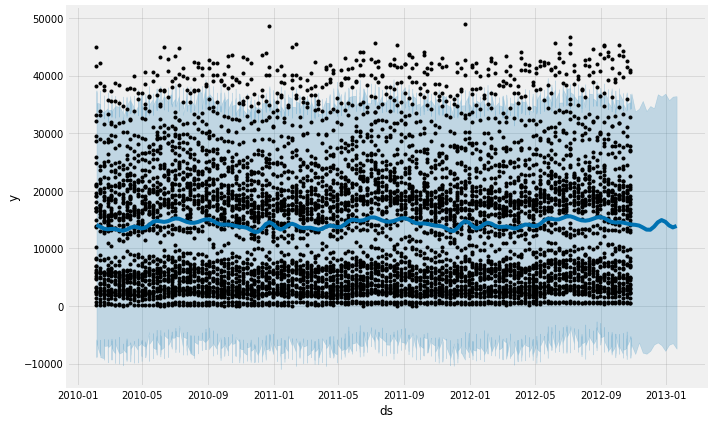

Model Intepretation


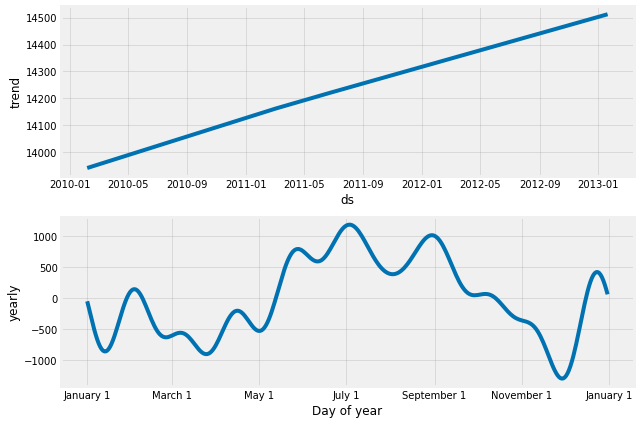

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Department: 98
             ds
5844 2012-12-23
5845 2012-12-30
5846 2013-01-06
5847 2013-01-13
5848 2013-01-20
             ds         yhat   yhat_lower    yhat_upper
5844 2012-12-23  7757.983431 -2449.502714  18155.336619
5845 2012-12-30  6870.674184 -3773.460976  17564.257268
5846 2013-01-06  5644.163443 -4743.443856  16715.679828
5847 2013-01-13  4789.848035 -5925.373646  16085.742413
5848 2013-01-20  4814.307048 -6657.453991  16293.818394
Forcasting


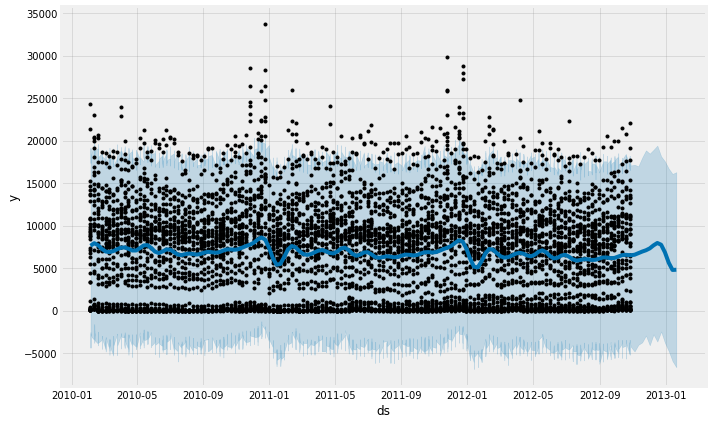

Model Intepretation


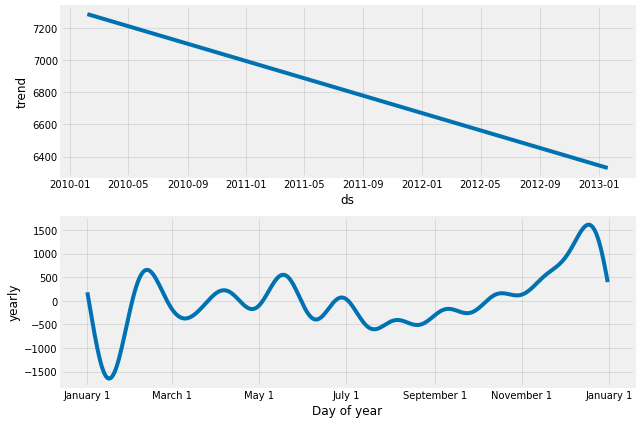

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Department: 99
            ds
870 2012-12-23
871 2012-12-30
872 2013-01-06
873 2013-01-13
874 2013-01-20
            ds         yhat   yhat_lower   yhat_upper
870 2012-12-23  2125.192723   594.318859  3645.593134
871 2012-12-30  1148.137246  -372.545893  2748.604217
872 2013-01-06  -511.338369 -2104.244334  1087.853464
873 2013-01-13 -1793.959717 -3278.533103  -334.932285
874 2013-01-20 -1770.523419 -3370.040054  -150.645294
Forcasting


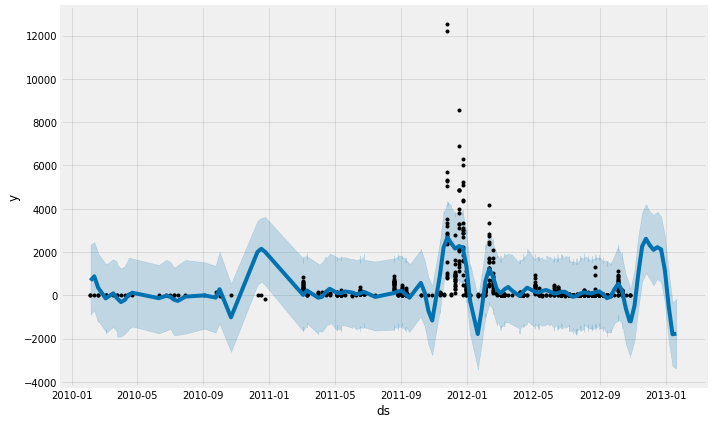

Model Intepretation


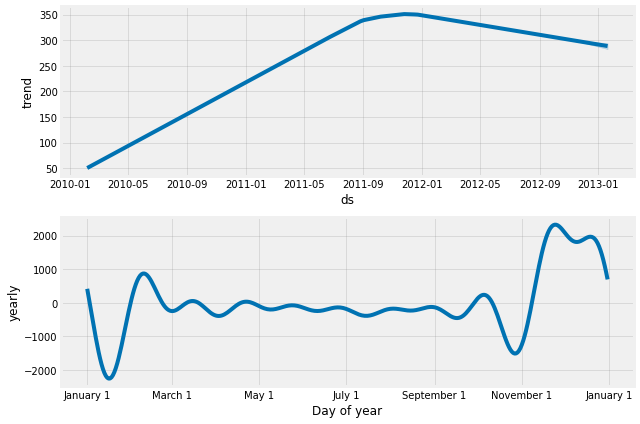

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 11.


Department: 39
           ds
24 2012-12-23
25 2012-12-30
26 2013-01-06
27 2013-01-13
28 2013-01-20
           ds         yhat   yhat_lower   yhat_upper
24 2012-12-23  -220.730543  -220.843057  -220.605204
25 2012-12-30 -1404.037100 -1404.173631 -1403.887617
26 2013-01-06 -2579.980302 -2580.144293 -2579.800630
27 2013-01-13 -2757.119877 -2757.297606 -2756.915704
28 2013-01-20 -1797.031021 -1797.237497 -1796.799160
Forcasting


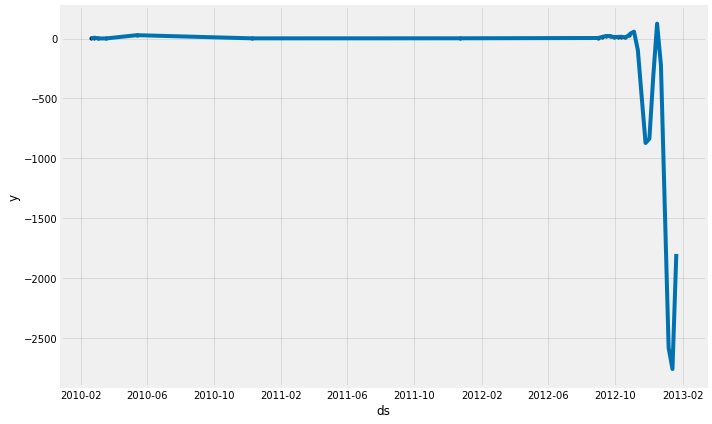

Model Intepretation


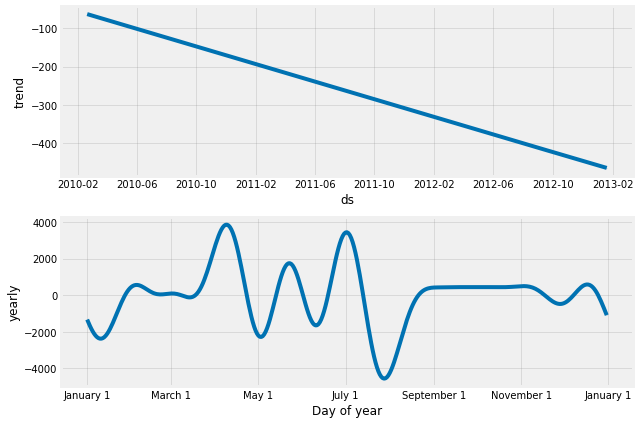

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Department: 50
             ds
1570 2012-12-23
1571 2012-12-30
1572 2013-01-06
1573 2013-01-13
1574 2013-01-20
             ds         yhat   yhat_lower   yhat_upper
1570 2012-12-23  2242.247731  -891.625388  5734.042571
1571 2012-12-30  2360.216132 -1119.084661  5983.518389
1572 2013-01-06  2559.278633  -696.248191  5991.399020
1573 2013-01-13  2714.850414  -770.627101  5835.324838
1574 2013-01-20  2730.730540  -633.061840  6226.292071
Forcasting


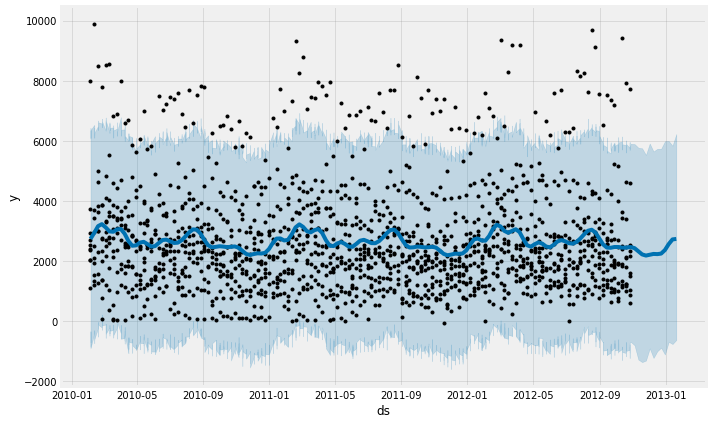

Model Intepretation


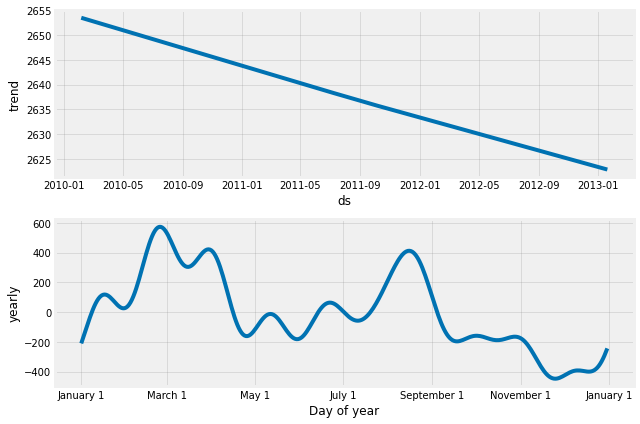

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 8.


Department: 43
           ds
20 2012-07-08
21 2012-07-15
22 2012-07-22
23 2012-07-29
24 2012-08-05
           ds       yhat  yhat_lower  yhat_upper
20 2012-07-08  39.370227   39.166099   39.498664
21 2012-07-15  22.092354   21.847564   22.249134
22 2012-07-22   4.007331    3.725432    4.194436
23 2012-07-29   0.794203    0.475537    1.007206
24 2012-08-05   9.462541    9.109169    9.706733
Forcasting


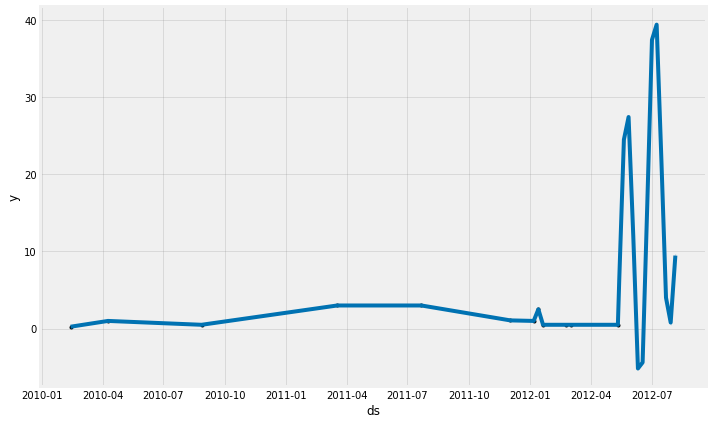

Model Intepretation


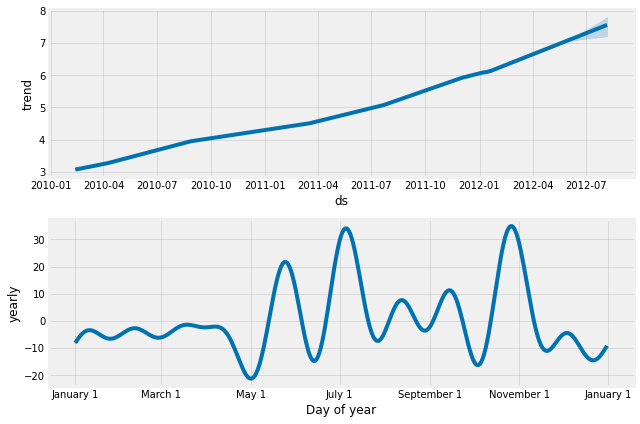

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Department: 65
            ds
151 2012-12-23
152 2012-12-30
153 2013-01-06
154 2013-01-13
155 2013-01-20
            ds          yhat    yhat_lower    yhat_upper
151 2012-12-23  47916.218896  41261.954016  55082.335111
152 2012-12-30  47249.104822  40694.824768  54264.312222
153 2013-01-06  47638.224010  41491.562137  54252.373675
154 2013-01-13  49454.884227  42834.388091  56335.764878
155 2013-01-20  51248.352054  44738.045866  57883.338014
Forcasting


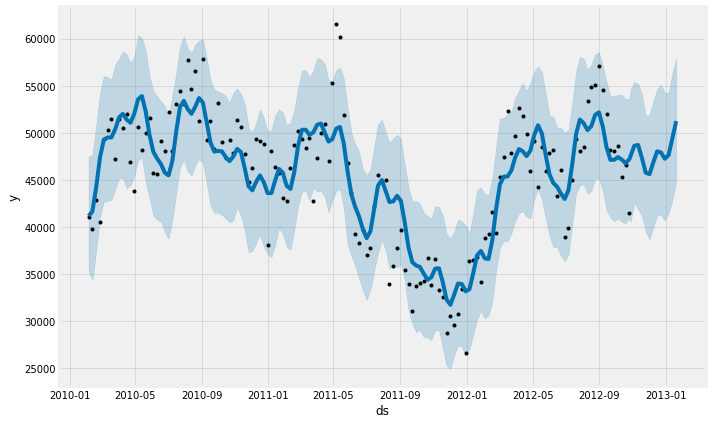

Model Intepretation


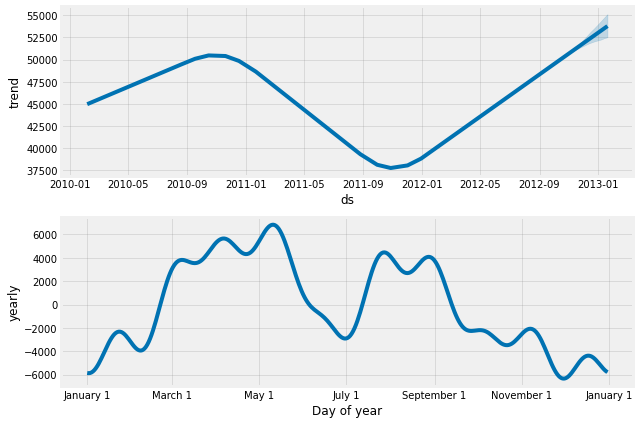

In [18]:
## run model for all deparment

for deptment in dept:
  print('='*50)
  print('Department: {}'.format(deptment))
  print('='*50)
  run_prophet(df[df['Dept'] == deptment])